In [3]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import networkx as nx
from itertools import combinations
from tqdm import tqdm
import pycountry
from countryinfo import CountryInfo
import pycountry
from countryinfo import CountryInfo
from tqdm import tqdm
from Countrydetails import country


In [ ]:
path = '/Users/g_private/Library/CloudStorage/OneDrive-Personal/Universität Zürich/FS25/Complex Newtworks Yas/data/co-attention.csv'
df=pd.read_csv(path)
df=df.dropna()

df['countries_mentioned_list']=df['countries_mentioned'].apply(lambda x: x.split(','))
df['affiliations_list']=df['affiliations'].apply(lambda x: x.split(','))
df['Mention_number']=df['countries_mentioned_list'].apply(lambda x: len(x))

df['countries_mentioned_list'] = df['countries_mentioned_list'].apply(
    lambda lst: [c.strip().title()           # remove spaces, standard capitalisation
                 .replace('P.R. China', 'China')
                 .replace('Pr China', 'China')
                 .replace('People’s Republic Of China', 'China')
                 .replace('Cn', 'China')
                 for c in lst]
)
df['affiliations_list'] = df['affiliations_list'].apply(
    lambda lst: [c.strip().title()           # remove spaces, standard capitalisation
                 .replace('P.R. China', 'China')
                 .replace('Pr China', 'China')
                 .replace('People’s Republic Of China', 'China')
                 .replace('Cn', 'China')
                 for c in lst])

# flatten with respect to to the aggregated_value column
df = df.loc[df.index.repeat(df['aggregated_value'])].reset_index(drop= True)

df['affiliations_list'] = df['affiliations_list'] \
    .apply(lambda codes: [c.upper() for c in codes])

# List of columns to remove
cols_to_drop = [
    'countries_mentioned',
    'affiliations',
    'aggregated_value',
    #'affiliations_list',
    'Mention_number'
]

# Option 1: create a new DataFrame without those columns
df= df.drop(columns=cols_to_drop)

df['countries_mentioned_list'] = df['countries_mentioned_list'] \
    .apply(lambda codes: [c.upper() for c in codes])
# remove entries with only 1 country mentioned
df = df[df['countries_mentioned_list'].apply(len) > 1]

df['countries_mentioned_list'] = df['countries_mentioned_list'].apply(lambda lst:[c for c in lst if len(c) < 4]) 

df = df[df['countries_mentioned_list'].apply(len) > 1]

# Subregions

In [20]:
# take all years together
df= df.drop(columns=['Year'])

# 1) build a set of all ISO-3 codes
iso3_set = {c.alpha_3 for c in pycountry.countries}

# 2) define a helper that checks if all entries in a list are in that set
def is_all_iso3(code_list):
    return set(code_list).issubset(iso3_set)

# 3) apply it as a boolean mask
mask = df['countries_mentioned_list'].apply(is_all_iso3)

# 4) select only those rows
df = df[mask]



# 1) Build the mapping dict once
iso3_to_sub = {}
for country in pycountry.countries:
    try:
        sub = CountryInfo(country.name).subregion()
    except KeyError:
        sub = None
    iso3_to_sub[country.alpha_3] = sub

# 2b) Or, if you’d like to see a progress bar:
tqdm.pandas(desc="Mapping subregions")
df['subregions'] = df['countries_mentioned_list'] \
    .progress_map(lambda codes: [iso3_to_sub.get(c.upper()) for c in codes])

# 1) remove rows where '' appears in the country list
mask_no_empty = df['subregions'].apply(lambda codes: '' not in codes)
df = df[mask_no_empty]

Mapping subregions: 100%|██████████| 344547/344547 [00:00<00:00, 706406.61it/s] 


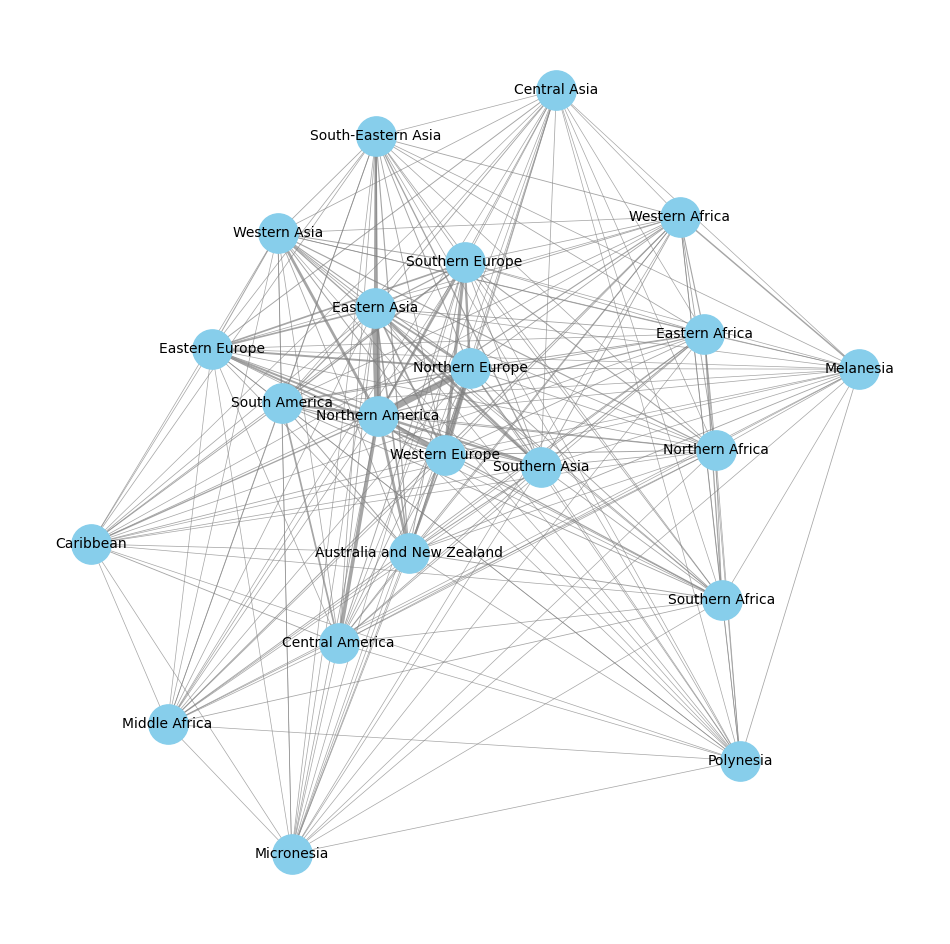

In [21]:
import matplotlib.pyplot as plt
import networkx as nx
import itertools
from collections import Counter
from math import comb

def build_fractional_comention_network(df, list_col='subregions', min_weight=0.005):
    """
    Pair-normalized fractional co-mention network:
      - Each paper with k subregions contributes 1 / comb(k,2) to each pair.
      - Edges with total weight ≥ min_weight appear in the graph.
      - Self‐loops are explicitly removed.
    """
    pair_weights = Counter()

    # 1) accumulate fractional weights per paper
    for regs in df[list_col]:
        uniq = [r for r in regs if r is not None]
        k = len(uniq)
        if k < 2:
            continue
        frac = 1.0 / comb(k, 2)
        for u, v in itertools.combinations(sorted(uniq), 2):
            pair_weights[(u, v)] += frac

    # 2) build graph
    G = nx.Graph()
    all_regs = {r for regs in df[list_col] for r in regs if r is not None}
    G.add_nodes_from(all_regs)

    for (u, v), w in pair_weights.items():
        if w >= min_weight:
            G.add_edge(u, v, weight=w)

    # 3) remove any accidental self loops
    G.remove_edges_from(nx.selfloop_edges(G))

    return G

# --- parameters you can tweak ---
MIN_WEIGHT = 0.01   # drop edges whose total fractional weight < 1% of a paper
SPRING_K   = 20    # repulsion parameter for layout
FIGSIZE    = (12, 12)

# build & draw
G_frac = build_fractional_comention_network(df, list_col='subregions', min_weight=MIN_WEIGHT)

# extract and normalize edge‐widths
weights = [G_frac[u][v]['weight'] for u, v in G_frac.edges()]
mn, mx = min(weights), max(weights)
widths = [0.5 + 4.5 * ((w - mn) / (mx - mn)) for w in weights]

plt.figure(figsize=FIGSIZE)
pos = nx.spring_layout(G_frac, k=SPRING_K, seed=42)

nx.draw_networkx_nodes(G_frac, pos,
                       node_size=800,
                       node_color='skyblue')
nx.draw_networkx_edges(G_frac, pos,
                       width=widths,
                       edge_color='gray',
                       alpha=0.7)
nx.draw_networkx_labels(G_frac, pos, font_size=10)

#plt.title(f"Fractional Subregion Co‐mention (min_weight={MIN_WEIGHT})")
plt.axis('off')
plt.show()


# Religions

In [24]:
import os
import json
import pandas as pd

# Path to your JSON files
folder_path = "/Users/g_private/Library/CloudStorage/OneDrive-Personal/Universität Zürich/FS25/Complex Newtworks Yas/data/countries"

# Collect data
records = []
for filename in os.listdir(folder_path):
    if filename.endswith(".json"):
        with open(os.path.join(folder_path, filename), 'r', encoding='utf-8') as f:
            data = json.load(f)
            iso3 = data.get('ISO', {}).get('alpha3')
            religion = data.get('religion')
            records.append({'ISO3': iso3, 'religion': religion})

# 1) Build a mapping ISO3 → religion
iso3_to_religion = { rec['ISO3']: rec['religion']
                     for rec in records
                     if rec.get('ISO3') and rec.get('religion') }

# 2) Define a function to map a list of ISO3 codes to religions
def map_to_religions(code_list):
    # look up each code, skip ones not in our map
    return [ iso3_to_religion[c]
             for c in code_list
             if c in iso3_to_religion ]

# 3) Apply it to your DataFrame
df['religions'] = df['countries_mentioned_list'].apply(map_to_religions)


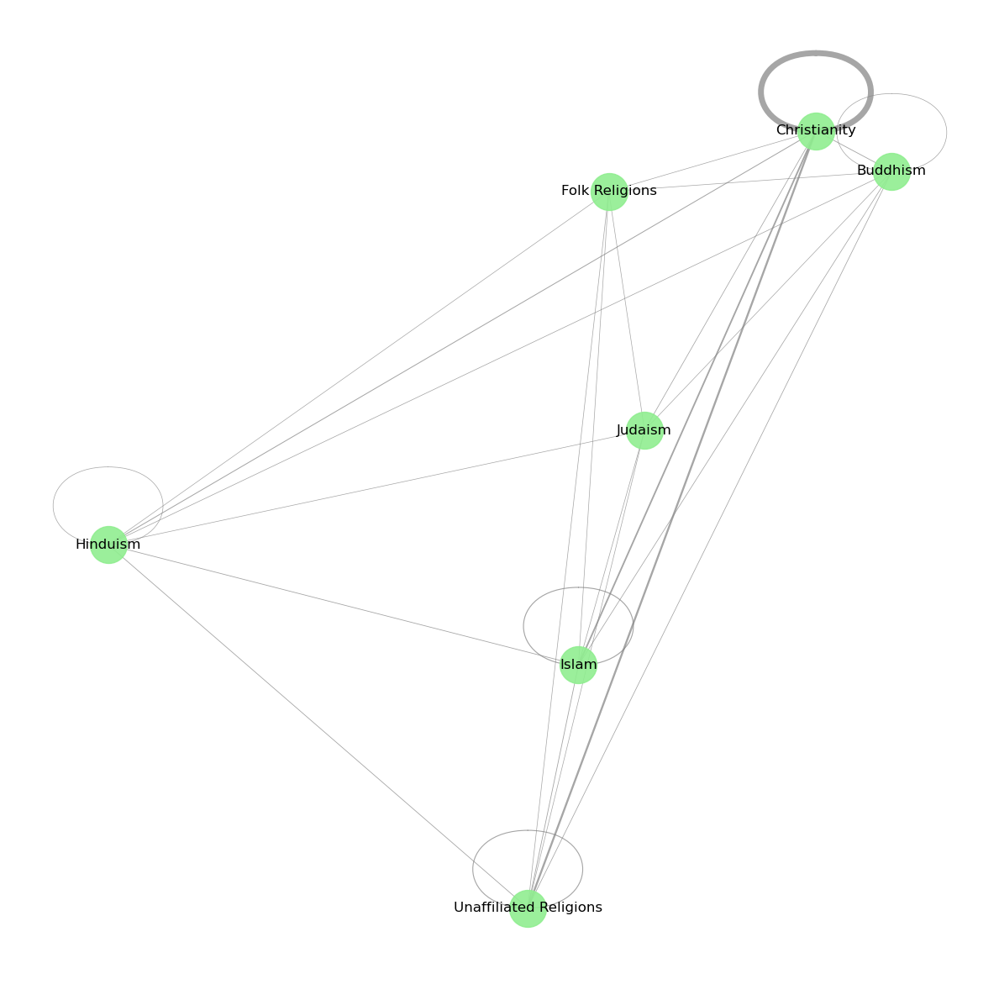

In [25]:
import matplotlib.pyplot as plt
import networkx as nx
import itertools
from collections import Counter
from math import comb

def build_fractional_comention_network(df, list_col='religions', min_weight=0.01):
    """
    Pair-normalized fractional co-mention network:
      - Each paper with k items in `list_col` contributes 1/comb(k,2) to each pair.
      - Edges whose total fractional weight ≥ min_weight are kept.
      - Self-loops are removed.
    """
    pair_weights = Counter()

    # accumulate fractional weights per paper
    for items in df[list_col]:
        uniq = [x for x in items if x is not None]
        k = len(uniq)
        if k < 2:
            continue
        frac = 1.0 / comb(k, 2)
        for u, v in itertools.combinations(sorted(uniq), 2):
            pair_weights[(u, v)] += frac

    # build the graph
    G = nx.Graph()
    all_items = {x for items in df[list_col] for x in items if x is not None}
    G.add_nodes_from(all_items)

    for (u, v), w in pair_weights.items():
        if w >= min_weight:
            G.add_edge(u, v, weight=w)

    # ensure no self-loops
    #G.remove_edges_from(nx.selfloop_edges(G))
    return G

# parameters
MIN_WEIGHT = 0.001   # drop any co-mention link whose total fractional weight < 1% of a paper
SPRING_K   = 0.01
FIGSIZE    = (12, 12)

# build & draw
G_frac = build_fractional_comention_network(df, list_col='religions', min_weight=MIN_WEIGHT)

# normalize edge widths
weights = [G_frac[u][v]['weight'] for u, v in G_frac.edges()]
mn, mx = min(weights), max(weights)
widths = [0.5 + 4.5 * ((w - mn) / (mx - mn)) for w in weights]

plt.figure(figsize=FIGSIZE)
pos = nx.spring_layout(G_frac, k=SPRING_K, seed=42)

# nodes
nx.draw_networkx_nodes(G_frac, pos,
                       node_size=1000,
                       node_color='lightgreen',
                       alpha=0.9)

# edges with variable thickness
nx.draw_networkx_edges(G_frac, pos,
                       width=widths,
                       edge_color='gray',
                       alpha=0.7)

# labels
nx.draw_networkx_labels(G_frac, pos, font_size=12)

#plt.title(f"Religion Co‐mention Network (fractional, min_weight={MIN_WEIGHT})")
plt.axis('off')
plt.tight_layout()
plt.show()


# Income

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import itertools
from collections import Counter
from tqdm.auto import tqdm

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import pandas as pd
import pycountry

#GDP per capita, current prices, IMF
#(U.S. dollars per capita)"
# path to your file
IMF_file_path = "/Users/g_private/Library/CloudStorage/OneDrive-Personal/Universität Zürich/FS25/Complex Newtworks Yas/data/IMF.xls"

# if you know the sheet name (e.g. “Sheet1”):
df_IMF = pd.read_excel(IMF_file_path)
df_IMF = df_IMF.iloc[1:-2, [0, 24]]
df_IMF.columns = ['Country', 'GDP_per_capita_2022']





# helper to map a country name to ISO3, falling back to None
def name_to_iso3(name):
    try:
        # pycountry’s lookup will match on name, alpha_2, alpha_3, common_name, etc.
        return pycountry.countries.lookup(name).alpha_3
    except Exception:
        return None

# apply it
df_IMF['ISO3'] = df_IMF['Country'].apply(name_to_iso3)

# take a look
print(df_IMF.head())

# build lookup dict ISO3 → GDP
gdp_lookup = dict(zip(df_IMF['ISO3'], df_IMF['GDP_per_capita_2022']))

# 2) Now in your main df you have:
#    countries_mentioned_list
# 1  [USA, AUS]
# 2  [PRT]
# 3  [IRL, DEU, SWE, POL]
# …

# map each list to the matching GDPs
def map_gdps(iso_list):
    return [ gdp_lookup.get(code, None) for code in iso_list ]

df['gdp_per_capita_list'] = df['countries_mentioned_list'].apply(map_gdps)

# 3) Inspect
print(df[['countries_mentioned_list','gdp_per_capita_list']].head())

# 1) collapse each paper's list to a mean GDP
def mean_gdp(lst):
    vals = [v for v in lst if isinstance(v, (int, float, np.number))]
    return np.mean(vals) if vals else np.nan

mean_gdps = df['gdp_per_capita_list'].apply(mean_gdp).dropna()


       Country GDP_per_capita_2022 ISO3
1  Afghanistan             no data  AFG
2      Albania           10012.917  ALB
3      Algeria            5681.632  DZA
4      Andorra           46359.174  AND
5       Angola            3053.759  AGO
    countries_mentioned_list                           gdp_per_capita_list
0                 [USA, AUS]                         [85812.176, 66247.96]
2       [IRL, DEU, SWE, POL]  [106455.886, 54989.76, 57625.095, 24810.444]
4                 [CHL, CAN]                        [16439.479, 54473.186]
5       [BLR, ITA, UKR, RUS]    [7794.265, 40224.012, 5711.164, 14794.697]
863          [ITA, GRC, USA]             [40224.012, 24716.307, 85812.176]


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import itertools
from collections import Counter
from tqdm.auto import tqdm

# enable progress_apply
tqdm.pandas(desc="Binning each country GDP")

# 1) World Bank edges & labels
edges = [0, 1145, 4515, 14005, np.inf]
labels = [
    "Low income (≤ 1.1 k)",
    "Lower-middle (1.1–4.5 k)",
    "Upper-middle (4.5–14 k)",
    "High income (≥ 14 k)"
]

# 2) bin each GDP in the list to one of the 4 categories
def country_bins(gdp_list):
    bins = []
    for g in gdp_list:
        if isinstance(g, (int, float, np.number)):
            b = pd.cut([g], bins=edges, labels=labels, include_lowest=True)[0]
            if pd.notnull(b):
                bins.append(b)
    return bins

df['gdp_bins'] = df['gdp_per_capita_list'].progress_apply(country_bins)

# 3) build co-mention network
def build_bin_network(df, col='gdp_bins', min_weight=5):
    ctr = Counter()
    for blist in tqdm(df[col], desc="Counting bin-co-mentions"):
        uniq = set(blist)
        for u, v in itertools.combinations(sorted(uniq), 2):
            ctr[(u, v)] += 1

    G = nx.Graph()
    G.add_nodes_from(labels)
    for (u, v), w in ctr.items():
        if w >= min_weight:
            G.add_edge(u, v, weight=w)
    return G

G = build_bin_network(df, min_weight=5)

# 4) remove isolated bins
isolates = list(nx.isolates(G))
print(f"Removing {len(isolates)} isolated bins:", isolates)
G.remove_nodes_from(isolates)


Counting bin-co-mentions: 100%|██████████| 352218/352218 [00:00<00:00, 2411910.03it/s]

Removing 0 isolated bins: []


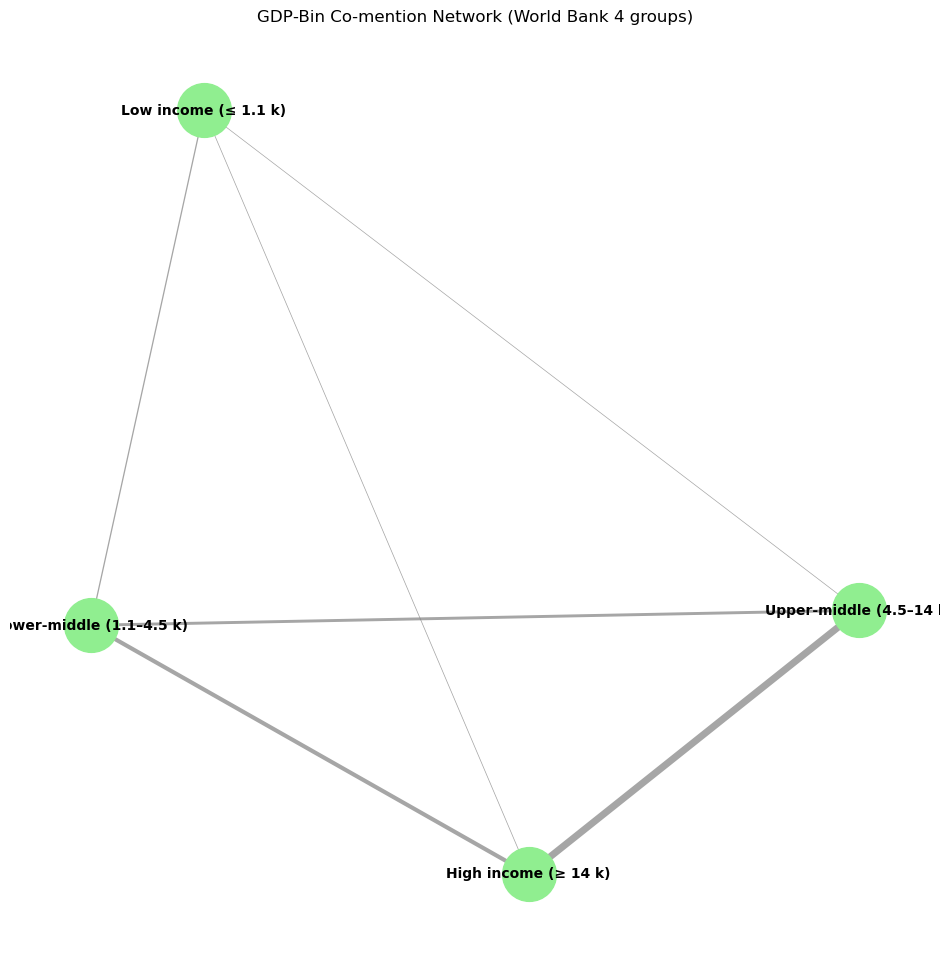

In [15]:

# 5) draw the 4-bin network
if len(G.edges()) > 0:
    weights = [G[u][v]['weight'] for u, v in G.edges()]
    mn, mx = min(weights), max(weights)
    widths = [0.5 + 4.5*(w-mn)/(mx-mn) for w in weights]

    pos = nx.spring_layout(G, k=1.5, seed=42)
    plt.figure(figsize=(12,12))
    nx.draw_networkx_nodes(G, pos, node_size=1500, node_color='lightgreen')
    nx.draw_networkx_edges(G, pos, width=widths, edge_color='gray', alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')
    plt.title("GDP‐Bin Co‐mention Network (World Bank 4 groups)")
    plt.axis('off')
    plt.show()
else:
    print("No edges above min_weight threshold.")


# Pygen

Graph: 247 nodes, 17554 edges


100%|██████████| 50/50 [00:04<00:00, 12.09it/s]


[<Axes: xlabel='$log_{10}(t)$', ylabel='$log_{10}(t^\\prime)$'>,
 <Axes: xlabel='$log_{10}(t)$', ylabel='NVI'>,
 <Axes: ylabel='Stability'>,
 <Axes: ylabel='# clusters'>,
 <Axes: xlabel='$log_{10}(t)$', ylabel='Block NVI'>]

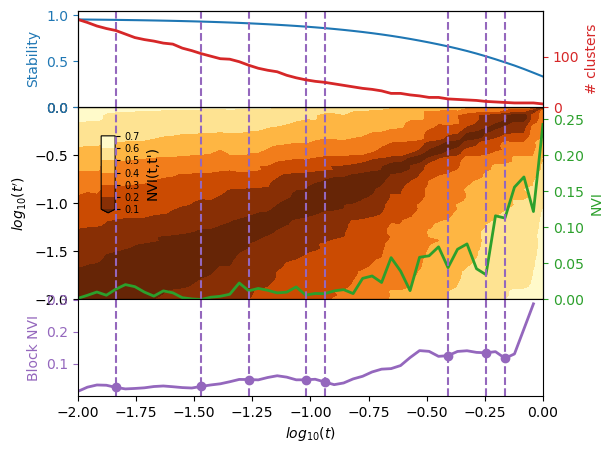

In [16]:
import itertools
from collections import Counter
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import scipy.sparse as sp
import pygenstability as pgs
from pygenstability import plotting

# ──────────────────────────────────────────────
# 1) Build co-mention network from your df
# ──────────────────────────────────────────────
def build_comention_graph(df, list_col='countries_mentioned_list', min_weight=0.01, fractional=True):
    edge_counts = Counter()
    for countries in df[list_col]:
        uniq = sorted(set(countries))  # remove duplicates
        k = len(uniq)
        if k < 2:
            continue
        weight_per_edge = 1 / (k * (k - 1) / 2) if fractional else 1
        for u, v in itertools.combinations(uniq, 2):
            edge_counts[(u, v)] += weight_per_edge
    
    G = nx.Graph()
    for (u, v), w in edge_counts.items():
        if w >= min_weight:
            G.add_edge(u, v, weight=w)
    return G

G = build_comention_graph(df, min_weight=0)  # adjust min_weight if needed
print(f"Graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ──────────────────────────────────────────────
# 2) Convert to adjacency for PyGenStability
# ──────────────────────────────────────────────
node_order = list(G.nodes())
A = nx.to_numpy_array(G, nodelist=node_order, weight='weight')

# ──────────────────────────────────────────────
# 3) Run multiscale community detection
# ──────────────────────────────────────────────
results = pgs.run(
    sp.csr_matrix(A),
    method="leiden",
    n_scale=50,
    n_tries=100,
    min_scale=-2,        # adjust if you want fewer/more communities
    max_scale=0,
    constructor="linearized",
    n_workers=16
)

# Identify robust scales
results = pgs.identify_optimal_scales(results, kernel_size=4, window_size=2)
plotting.plot_scan(results)



=== Communities at scale 1 ===
Community 0: members=['AUS']
Community 1: members=['USA']
Community 2: members=['DEU']
Community 3: members=['IRL']
Community 4: members=['POL']
Community 5: members=['SWE']
Community 6: members=['CAN']
Community 7: members=['CHL']
Community 8: members=['BLR']
Community 9: members=['ITA']
Community 10: members=['RUS']
Community 11: members=['UKR']
Community 12: members=['GRC']
Community 13: members=['MEX']
Community 14: members=['ISL', 'FRO']
Community 15: members=['CHN']
Community 16: members=['KAZ']
Community 17: members=['UZB', 'TJK', 'KGZ', 'TKM']
Community 18: members=['UGA']
Community 19: members=['GBR']
Community 20: members=['NZL']
Community 21: members=['MYS']
Community 22: members=['CZE']
Community 23: members=['HUN']
Community 24: members=['FRA']
Community 25: members=['DNK']
Community 26: members=['FIN', 'ALA']
Community 27: members=['ESP']
Community 28: members=['ISR', 'PSE']
Community 29: members=['ZAF']
Community 30: members=['IRN', 'AZE']

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



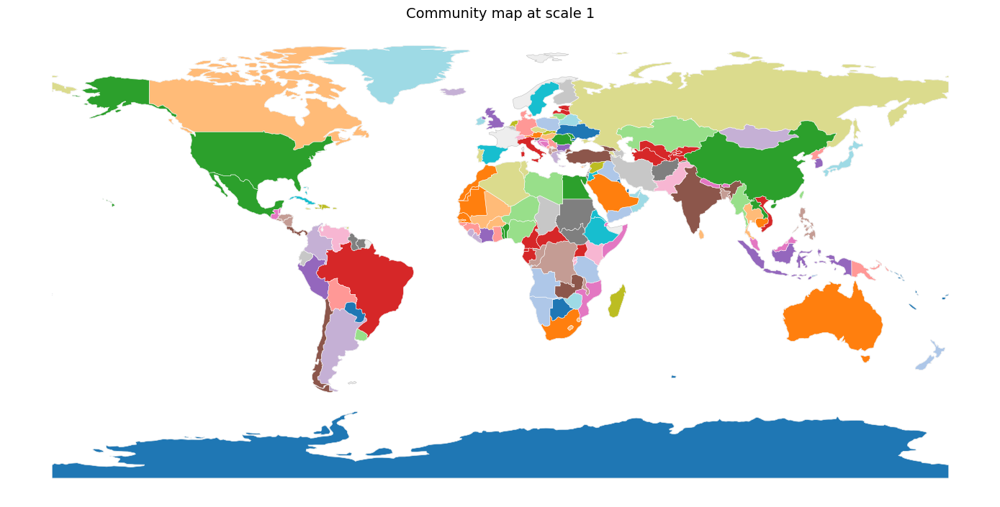


=== Communities at scale 2 ===
Community 0: members=['AUS']
Community 1: members=['USA']
Community 2: members=['DEU']
Community 3: members=['IRL']
Community 4: members=['POL']
Community 5: members=['SWE']
Community 6: members=['CAN', 'SPM']
Community 7: members=['CHL']
Community 8: members=['BLR', 'UKR']
Community 9: members=['ITA']
Community 10: members=['RUS']
Community 11: members=['GRC', 'ALB', 'MKD', 'XKS']
Community 12: members=['MEX']
Community 13: members=['ISL', 'GRL', 'FRO']
Community 14: members=['CHN']
Community 15: members=['KAZ', 'UZB', 'TJK', 'KGZ', 'TKM']
Community 16: members=['UGA', 'TZA', 'KEN']
Community 17: members=['GBR']
Community 18: members=['NZL']
Community 19: members=['MYS', 'BRN']
Community 20: members=['CZE', 'SVK', 'CSK']
Community 21: members=['HUN']
Community 22: members=['FRA']
Community 23: members=['DNK']
Community 24: members=['FIN', 'ALA']
Community 25: members=['ESP']
Community 26: members=['ISR', 'PSE']
Community 27: members=['ZAF', 'LSO']
Commu

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



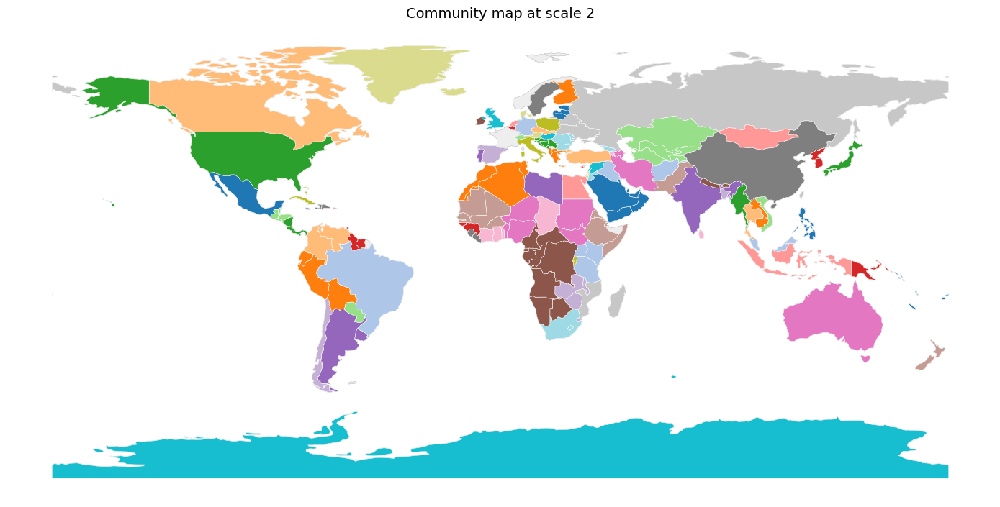


=== Communities at scale 3 ===
Community 0: members=['AUS']
Community 1: members=['USA']
Community 2: members=['DEU']
Community 3: members=['IRL']
Community 4: members=['POL']
Community 5: members=['SWE']
Community 6: members=['CAN', 'SPM']
Community 7: members=['CHL', 'ARG', 'URY']
Community 8: members=['BLR', 'UKR']
Community 9: members=['ITA']
Community 10: members=['RUS']
Community 11: members=['GRC', 'ALB', 'MKD', 'XKS']
Community 12: members=['MEX']
Community 13: members=['ISL', 'ATA', 'GRL', 'FRO', 'BVT', 'ATF', 'SGS', 'HMD']
Community 14: members=['CHN']
Community 15: members=['KAZ', 'UZB', 'TJK', 'KGZ', 'TKM']
Community 16: members=['UGA', 'TZA', 'KEN']
Community 17: members=['GBR', 'SJM']
Community 18: members=['NZL']
Community 19: members=['MYS', 'IDN', 'BRN', 'TLS']
Community 20: members=['CZE', 'HUN', 'SVK', 'CSK']
Community 21: members=['FRA']
Community 22: members=['DNK']
Community 23: members=['FIN', 'ALA']
Community 24: members=['ESP', 'AND']
Community 25: members=['I

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



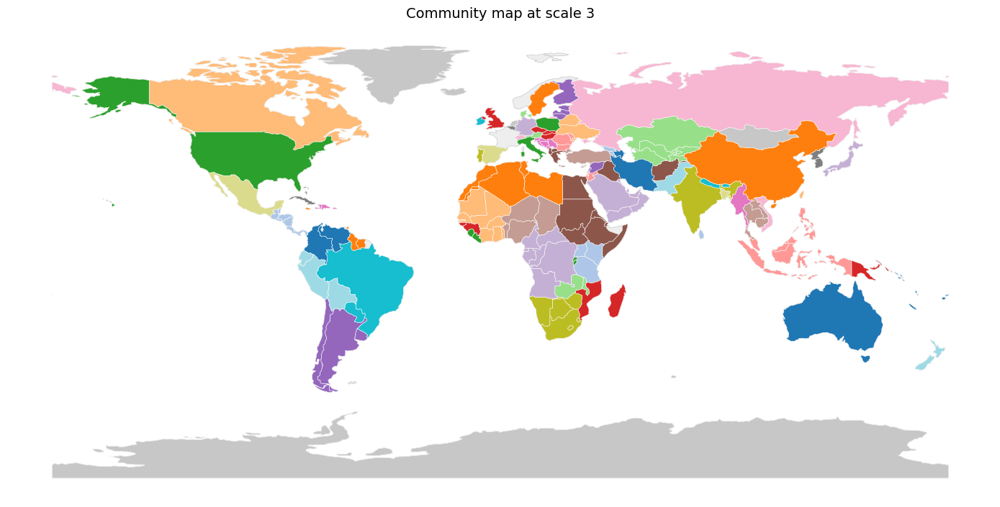


=== Communities at scale 4 ===
Community 0: members=['AUS', 'NZL', 'CXR', 'NFK', 'CCK']
Community 1: members=['USA']
Community 2: members=['DEU']
Community 3: members=['IRL', 'GBR', 'IMN', 'SJM']
Community 4: members=['POL', 'CZE', 'HUN', 'SVK', 'CSK']
Community 5: members=['SWE', 'FIN', 'NOR', 'ALA']
Community 6: members=['CAN', 'SPM']
Community 7: members=['CHL', 'ARG', 'URY']
Community 8: members=['BLR', 'RUS', 'UKR', 'SUN']
Community 9: members=['ITA', 'SMR']
Community 10: members=['GRC', 'ALB', 'MKD', 'XKS']
Community 11: members=['MEX']
Community 12: members=['ISL', 'ATA', 'GRL', 'FRO', 'BVT', 'ATF', 'SGS', 'HMD']
Community 13: members=['CHN', 'MNG']
Community 14: members=['KAZ', 'UZB', 'TJK', 'KGZ', 'TKM']
Community 15: members=['UGA', 'TZA', 'KEN', 'RWA', 'ZMB', 'MWI', 'BDI']
Community 16: members=['MYS', 'IDN', 'SGP', 'BRN', 'TLS']
Community 17: members=['FRA', 'MCO']
Community 18: members=['DNK']
Community 19: members=['ESP', 'PRT', 'GIB', 'AND']
Community 20: members=['ISR'

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



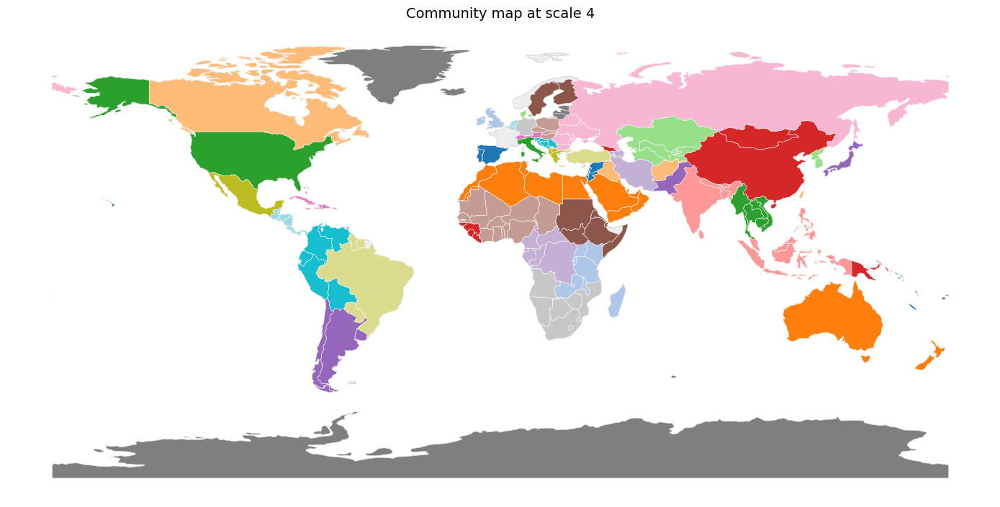


=== Communities at scale 5 ===
Community 0: members=['AUS', 'NZL', 'CXR', 'NFK', 'CCK']
Community 1: members=['USA']
Community 2: members=['DEU']
Community 3: members=['IRL', 'GBR', 'IMN', 'SJM']
Community 4: members=['POL', 'CZE', 'HUN', 'SVK', 'CSK']
Community 5: members=['SWE', 'DNK', 'FIN', 'NOR', 'ALA']
Community 6: members=['CAN', 'SPM']
Community 7: members=['CHL', 'PER', 'COL', 'BOL', 'ECU', 'VEN']
Community 8: members=['BLR', 'RUS', 'UKR', 'KAZ', 'UZB', 'SUN', 'TJK', 'KGZ', 'TKM']
Community 9: members=['ITA', 'VAT', 'SMR']
Community 10: members=['GRC', 'ALB', 'MKD', 'XKS']
Community 11: members=['MEX']
Community 12: members=['ISL', 'ATA', 'GRL', 'FRO', 'BVT', 'ATF', 'SGS', 'HMD']
Community 13: members=['CHN', 'MNG']
Community 14: members=['UGA', 'SDN', 'TZA', 'KEN', 'SOM', 'RWA', 'ETH', 'SSD', 'BDI', 'ERI', 'DJI']
Community 15: members=['MYS', 'IDN', 'SGP', 'BRN', 'TLS']
Community 16: members=['FRA', 'MCO']
Community 17: members=['ESP', 'PRT', 'GIB', 'AND']
Community 18: memb

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



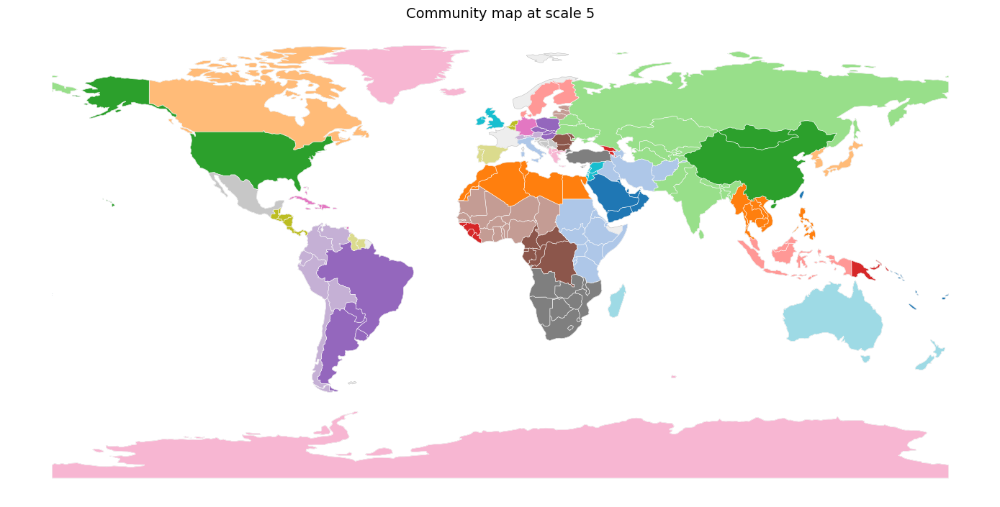


=== Communities at scale 6 ===
Community 0: members=['AUS', 'NZL', 'KIR', 'ATA', 'NCL', 'MNP', 'FJI', 'PYF', 'TON', 'PLW', 'VUT', 'CXR', 'NFK', 'SLB', 'TUV', 'AIA', 'ASM', 'MHL', 'COK', 'WSM', 'GUM', 'NIU', 'TKL', 'PCN', 'BVT', 'NRU', 'ATF', 'WLF', 'CCK', 'SGS', 'HMD']
Community 1: members=['USA', 'CAN', 'MEX', 'GEO', 'PRI', 'JEY', 'SPM']
Community 2: members=['DEU', 'CHE', 'NLD', 'BEL', 'LUX', 'AUT', 'LIE']
Community 3: members=['IRL', 'GBR', 'IMN', 'GGY', 'IOT', 'SJM']
Community 4: members=['POL', 'GRC', 'CZE', 'HUN', 'ROU', 'SRB', 'MDA', 'SVK', 'ALB', 'BGR', 'SVN', 'HRV', 'YUG', 'MKD', 'BIH', 'MNE', 'CSK', 'SCG', 'XKS']
Community 5: members=['SWE', 'ISL', 'DNK', 'FIN', 'NOR', 'EST', 'LTU', 'ALA', 'GRL', 'LVA', 'FRO']
Community 6: members=['CHL', 'ARG', 'BRA', 'PER', 'URY', 'GTM', 'COL', 'BLZ', 'PAN', 'BOL', 'PRY', 'ECU', 'GUY', 'VEN', 'CRI', 'SLV', 'HND', 'GUF', 'SUR', 'NIC']
Community 7: members=['BLR', 'RUS', 'UKR', 'KAZ', 'UZB', 'SUN', 'TJK', 'KGZ', 'TKM']
Community 8: members=[

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



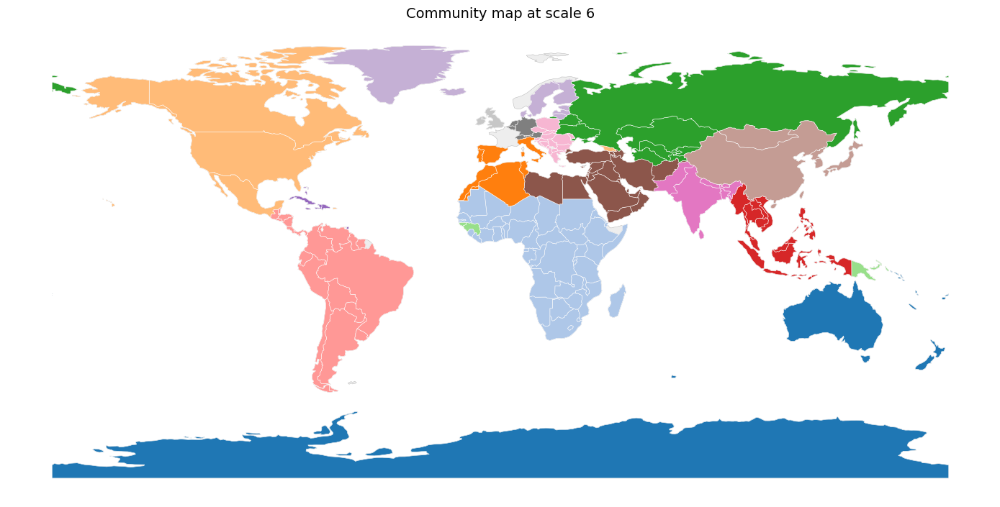


=== Communities at scale 7 ===
Community 0: members=['AUS', 'NZL', 'KIR', 'ATA', 'NCL', 'FJI', 'PYF', 'TON', 'PLW', 'VUT', 'CXR', 'NFK', 'SLB', 'TUV', 'AIA', 'ASM', 'MHL', 'COK', 'WSM', 'NIU', 'TKL', 'PCN', 'BVT', 'NRU', 'ATF', 'WLF', 'CCK', 'SGS', 'HMD']
Community 1: members=['USA', 'CAN', 'MEX', 'GEO', 'PRI', 'MNP', 'JEY', 'GUM', 'BMU', 'SPM']
Community 2: members=['DEU', 'ITA', 'FRA', 'ESP', 'CHE', 'NLD', 'PRT', 'BEL', 'LUX', 'AUT', 'GIB', 'LIE', 'VAT', 'AND', 'SMR', 'MCO']
Community 3: members=['IRL', 'GBR', 'IMN', 'GGY', 'IOT', 'SJM']
Community 4: members=['POL', 'BLR', 'RUS', 'UKR', 'KAZ', 'UZB', 'CZE', 'HUN', 'ROU', 'SRB', 'EST', 'SUN', 'MDA', 'SVK', 'LTU', 'TJK', 'BGR', 'SVN', 'LVA', 'HRV', 'KGZ', 'YUG', 'BIH', 'TKM', 'MNE', 'CSK', 'SCG']
Community 5: members=['SWE', 'ISL', 'DNK', 'FIN', 'NOR', 'ALA', 'GRL', 'FRO']
Community 6: members=['CHL', 'ARG', 'BRA', 'PER', 'URY', 'GTM', 'COL', 'BLZ', 'PAN', 'CUB', 'BOL', 'PRY', 'ECU', 'GUY', 'ANT', 'CUW', 'VEN', 'CRI', 'SLV', 'DMA', 'M

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



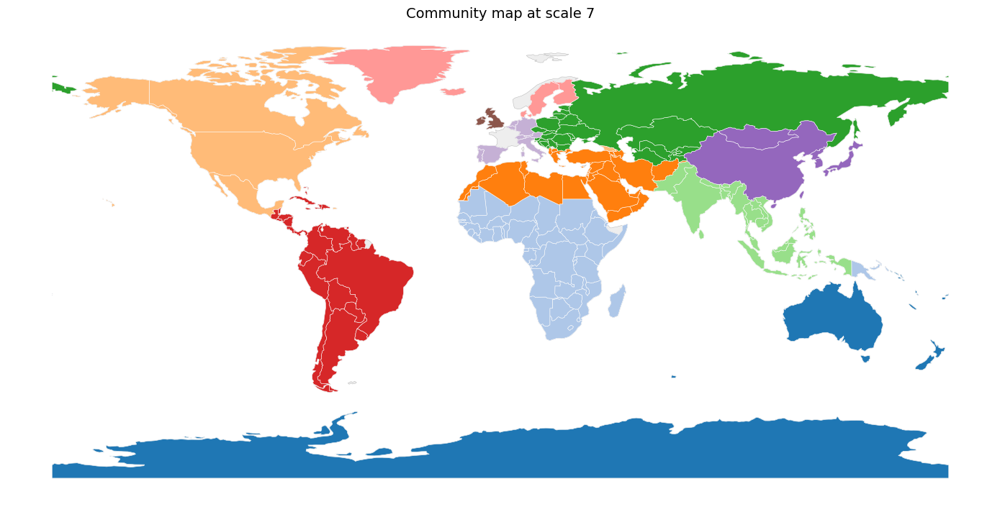


=== Communities at scale 8 ===
Community 0: members=['AUS', 'ISL', 'NZL', 'KIR', 'ATA', 'NCL', 'FJI', 'PYF', 'TON', 'GRL', 'VUT', 'CXR', 'NFK', 'SLB', 'TUV', 'FRO', 'AIA', 'ASM', 'COK', 'WSM', 'NIU', 'TKL', 'PCN', 'BVT', 'NRU', 'ATF', 'WLF', 'CCK', 'SGS', 'HMD']
Community 1: members=['USA', 'CAN', 'MEX', 'GEO', 'PRI', 'MNP', 'JEY', 'MHL', 'GUM', 'BMU', 'GGY', 'SPM']
Community 2: members=['DEU', 'IRL', 'SWE', 'ITA', 'GBR', 'FRA', 'DNK', 'FIN', 'ESP', 'CHE', 'NLD', 'NOR', 'PRT', 'BEL', 'LUX', 'AUT', 'ALA', 'GIB', 'IMN', 'MLT', 'LIE', 'VAT', 'AND', 'SMR', 'MCO', 'IOT', 'SJM']
Community 3: members=['POL', 'BLR', 'RUS', 'UKR', 'KAZ', 'UZB', 'CZE', 'HUN', 'ROU', 'SRB', 'EST', 'SUN', 'MDA', 'SVK', 'LTU', 'TJK', 'BGR', 'SVN', 'LVA', 'HRV', 'KGZ', 'YUG', 'BIH', 'TKM', 'MNE', 'CSK', 'SCG']
Community 4: members=['CHL', 'ARG', 'BRA', 'PER', 'URY', 'GTM', 'COL', 'BLZ', 'PAN', 'CUB', 'BOL', 'PRY', 'ECU', 'GUY', 'ANT', 'CUW', 'VEN', 'CRI', 'SLV', 'DMA', 'MSR', 'MTQ', 'BHS', 'JAM', 'GLP', 'GRD', 'HND

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/4196389305.py:49: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



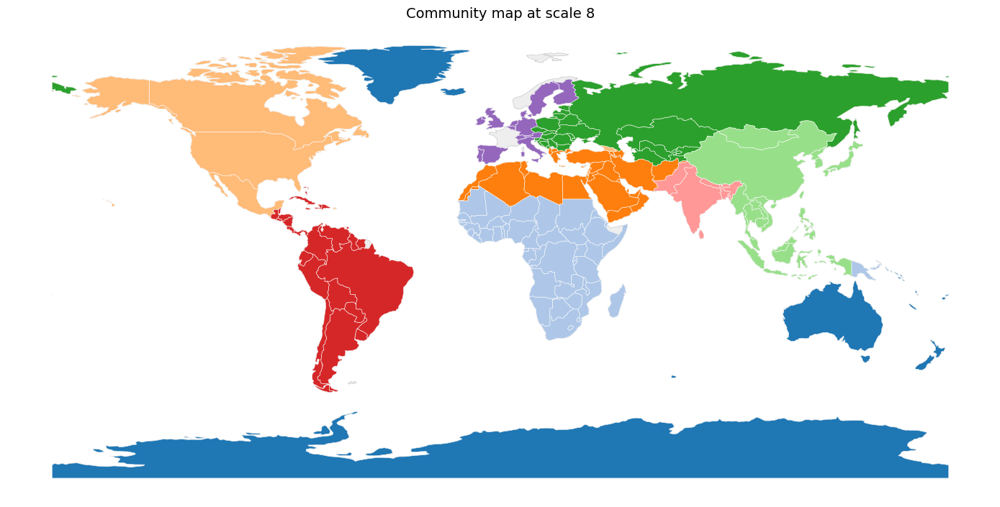

In [18]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches


selected_scales = results["selected_partitions"]

# --- Load Natural Earth countries from NACIS CDN (works on GeoPandas 1.x) ---
def prep_world_gdf():
    url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
    gdf = gpd.read_file(url)

    # Robustly find ISO3 column
    cand_cols = ["ISO_A3", "ADM0_A3", "iso_a3", "adm0_a3"]
    iso_col = next((c for c in cand_cols if c in gdf.columns), None)
    if iso_col is None:
        raise KeyError(f"Could not find ISO3 column in columns: {gdf.columns.tolist()}")

    gdf["ISO3"] = gdf[iso_col].replace({"-99": None})
    return gdf

def plot_communities_on_map(node_order, labels, world_gdf, title="", ax=None):
    # Build mapping DF
    lab = pd.Series(labels, index=node_order, name="community")
    df = lab.reset_index().rename(columns={"index": "ISO3"})

    # Optional code fixes (your graph codes -> NE ISO3)
    code_fix = {"ROM": "ROU", "UK": "GBR", "EL": "GRC"}
    df["ISO3"] = df["ISO3"].replace(code_fix)

    gdf = world_gdf.merge(df, on="ISO3", how="left")

    # Factorize to contiguous codes for discrete colormap
    present = gdf["community"].dropna()
    if len(present) == 0:
        if ax is None:
            _, ax = plt.subplots(figsize=(14, 8))
        gdf.plot(ax=ax, color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)
        ax.set_title(title); ax.set_axis_off(); plt.tight_layout(); plt.show()
        return

    codes, uniques = pd.factorize(present.astype(int))  # uniques = original community IDs
    gdf.loc[present.index, "comm_code"] = codes

    k = len(uniques)
    cmap = ListedColormap([cm.get_cmap("tab20")(i % 20) for i in range(k)])

    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 8))

    # Base layer
    gdf.plot(ax=ax, color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)

    # Communities layer
    gdf.dropna(subset=["comm_code"]).plot(
        ax=ax,
        column="comm_code",
        cmap=cmap,
        linewidth=0.4,
        edgecolor="white",
        legend=False,
    )

    # Legend with original IDs
    patches = [mpatches.Patch(color=cmap(i), label=f"C{int(cid)}") for i, cid in enumerate(uniques)]
    #ax.legend(handles=patches, title="Communities", loc="lower left", frameon=True)

    ax.set_title(title, fontsize=14)
    ax.set_axis_off()
    plt.tight_layout()
    plt.show()


# === Usage ===
world_gdf = prep_world_gdf()

for idx, part_idx in enumerate(selected_scales):
    labels = results["community_id"][part_idx]  # aligned with node_order

    # Optional: print members
    comms = dict(zip(node_order, labels))
    community_map = {}
    for node, cid in comms.items():
        community_map.setdefault(int(cid), []).append(node)

    print(f"\n=== Communities at scale {idx+1} ===")
    for cid in sorted(community_map):
        print(f"Community {cid}: members={community_map[cid]}")

    plot_communities_on_map(
        node_order=node_order,
        labels=labels,
        world_gdf=world_gdf,
        title=f"Community map at scale {idx+1}",
    )


# NMI

In [29]:
# =========================
# GeoPandas NMI Map Compare
# =========================
import os, json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import pycountry
from countryinfo import CountryInfo
from sklearn.metrics import normalized_mutual_info_score as NMI

# ---------- 0) World basemap (GeoPandas 1.x friendly) ----------
def prep_world_gdf():
    # Natural Earth (Admin 0 – Countries, 110m), fetched from NACIS CDN
    url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
    gdf = gpd.read_file(url)
    # Find ISO3 column robustly
    for c in ["ISO_A3", "ADM0_A3", "iso_a3", "adm0_a3"]:
        if c in gdf.columns:
            iso_col = c
            break
    else:
        raise KeyError(f"Could not find ISO3 col in: {list(gdf.columns)}")
    gdf["ISO3"] = gdf[iso_col].replace({"-99": None})
    return gdf[["ISO3", "geometry"]].copy()

WORLD_GDF = prep_world_gdf()

# Optional code fixes if your node codes use odd forms
CODE_FIX = {
    "UK": "GBR",
    "ROM": "ROU",
    "EL": "GRC",
    # "XKX": "XKS",  # NE lowres often excludes Kosovo; keep as-is if needed
}

def _fix_iso3(code: str) -> str:
    return CODE_FIX.get(code, code)

# ---------- 1) Ground-truth mappings ----------
def build_iso3_to_subregion(iso_list):
    def _sub(iso):
        try:
            c = pycountry.countries.get(alpha_3=iso)
            if c is None: return "Unknown"
            return CountryInfo(c.name).subregion() or "Unknown"
        except Exception:
            return "Unknown"
    return {iso: _sub(iso) for iso in iso_list}

def build_iso3_to_income_bins(imf_xls_path, iso_list):
    # Load and lightly normalize your IMF sheet (adjust if your file differs)
    df_imf = pd.read_excel(imf_xls_path)
    # Your earlier slicing:
    try:
        df_imf = df_imf.iloc[1:-2, [0, 24]]
    except Exception:
        pass
    df_imf.columns = ["Country", "GDP_per_capita_2022"]

    def to_iso3(name):
        try:
            return pycountry.countries.lookup(str(name)).alpha_3
        except Exception:
            return None

    df_imf["ISO3"] = df_imf["Country"].apply(to_iso3)
    df_imf = df_imf.dropna(subset=["ISO3", "GDP_per_capita_2022"])
    gdp = dict(zip(df_imf["ISO3"], df_imf["GDP_per_capita_2022"]))

    # World Bank-style bins (adjust thresholds/labels if you prefer)
    edges = [0, 1145, 4515, 14005, np.inf]
    labels = ["Low (≤1.1k)", "Lower-mid (1.1–4.5k)", "Upper-mid (4.5–14k)", "High (≥14k)"]

    def bin_one(iso):
        v = gdp.get(iso)
        if v is None or not np.isfinite(v): return "Unknown"
        b = pd.cut([v], bins=edges, labels=labels, include_lowest=True)[0]
        return str(b) if pd.notnull(b) else "Unknown"

    return {iso: bin_one(iso) for iso in iso_list}

def build_iso3_to_religion(json_folder, iso_list):
    # Expects per-country JSONs with {"ISO": {"alpha3": ...}, "religion": "..."}
    d = {}
    for fn in os.listdir(json_folder):
        if not fn.endswith(".json"): continue
        with open(os.path.join(json_folder, fn), "r", encoding="utf-8") as f:
            data = json.load(f)
            iso = str(data.get("ISO", {}).get("alpha3", "")).upper()
            rel = data.get("religion")
            if iso and isinstance(rel, str) and rel.strip():
                d[iso] = rel.strip()
    return {iso: d.get(iso, "Unknown") for iso in iso_list}

# ---------- 2) NMI + side-by-side GeoPandas maps ----------
def _factor_colors(values, cmap_name="tab20"):
    """Return factorized codes and a ListedColormap aligned to unique values order."""
    s = pd.Series(values)
    mask = s.notna()
    codes, uniques = pd.factorize(s[mask], sort=True)
    # Map back to full index, NaN stays NaN
    code_arr = pd.Series(np.nan, index=s.index, dtype="float")
    code_arr[mask] = codes
    uniques = list(uniques)
    cmap = plt.cm.get_cmap(cmap_name, max(2, len(uniques)))
    listed = ListedColormap([cmap(i) for i in range(len(uniques))])
    return code_arr.values, uniques, listed

def _legend_from_uniques(ax, uniques, cmap):
    patches = [mpatches.Patch(color=cmap(i), label=str(val)) for i, val in enumerate(uniques)]
    ax.legend(handles=patches, loc="lower left", bbox_to_anchor=(0, -0.02),
              frameon=True, fontsize=8, title="Groups")

def _build_gdf_for_maps(node_order, y_true, y_pred):
    # Build a tidy DF: ISO3, true, pred (apply any code fix)
    df_map = pd.DataFrame({"ISO3": [ _fix_iso3(c) for c in node_order ],
                           "true": y_true,
                           "pred": y_pred})
    # Merge onto world; countries not in node_order remain gray
    gdf = WORLD_GDF.merge(df_map, on="ISO3", how="left")
    return gdf

def plot_geopandas_pair(node_order, labels_pred, attr_map, attr_name, title_tag=""):
    """
    Draw two maps with the same basemap:
      - Left: colored by attr_map (ground truth)
      - Right: colored by labels_pred (PyGen communities)
      Shows NMI in the right map title.
    """
    # Align vectors (include "Unknown" to keep lengths equal)
    y_true = [attr_map.get(c, "Unknown") for c in node_order]
    y_pred = list(labels_pred)

    # Optionally drop Unknowns for NMI (comment out if you prefer to include them)
    mask = [yt != "Unknown" and yt is not None for yt in y_true]
    y_true_nmi = [yt for yt, m in zip(y_true, mask) if m]
    y_pred_nmi = [yp for yp, m in zip(y_pred, mask) if m]
    nmi = NMI(y_true_nmi, y_pred_nmi) if len(y_true_nmi) and len(set(y_true_nmi)) > 1 else np.nan

    gdf = _build_gdf_for_maps(node_order, y_true, y_pred)

    # Factorize for discrete colormaps
    true_codes, true_uniques, true_cmap = _factor_colors(gdf["true"])
    pred_codes, pred_uniques, pred_cmap = _factor_colors(gdf["pred"])

    fig, axes = plt.subplots(1, 2, figsize=(18, 7), constrained_layout=True)
    for ax, col_codes, cmap, title in [
        (axes[0], true_codes, true_cmap, f"{attr_name} (ground truth)"),
        (axes[1], pred_codes, pred_cmap, f"PyGen communities — NMI vs {attr_name}: {nmi:.3f}" if np.isfinite(nmi) else f"PyGen communities — NMI vs {attr_name}: n/a"),
    ]:
        # base: light gray
        WORLD_GDF.plot(ax=ax, color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)
        # overlay: only countries with values (dropna)
        gdf_nonnull = gdf[~pd.isna(col_codes)].copy()
        if len(gdf_nonnull):
            gdf_nonnull.plot(ax=ax, column=pd.Series(col_codes, index=gdf.index).dropna(),
                             cmap=cmap, linewidth=0.3, edgecolor="white")
        ax.set_axis_off()
        ax.set_title(title, fontsize=13)

        # legend
        uniques = true_uniques if ax is axes[0] else pred_uniques
        used_cmap = true_cmap if ax is axes[0] else pred_cmap
        # keep legend concise if too many categories
        max_items = 15
        if len(uniques) > max_items:
            uniques_display = uniques[:max_items]
        else:
            uniques_display = uniques
        patches = [mpatches.Patch(color=used_cmap(i), label=str(v)) for i, v in enumerate(uniques_display)]
        ax.legend(handles=patches, loc="lower left", bbox_to_anchor=(0, -0.02),
                  frameon=True, fontsize=8, title="Groups")

    if title_tag:
        fig.suptitle(title_tag, fontsize=14, y=1.02)

    plt.show()
    return float(nmi) if np.isfinite(nmi) else np.nan

# ---------- 3) Driver across attributes at one PyGen scale ----------
def compare_on_maps_geopandas(
    node_order, results, part_idx,
    religion_json_folder, imf_xls_path
):
    # Ensure ISO3 fixes applied to node_order just for mapping
    node_order_fixed = [_fix_iso3(c) for c in node_order]

    # Build attribute maps limited to countries present
    sub_map = build_iso3_to_subregion(node_order_fixed)
    inc_map = build_iso3_to_income_bins(imf_xls_path, node_order_fixed)
    rel_map = build_iso3_to_religion(religion_json_folder, node_order_fixed)

    labels_pred = results["community_id"][part_idx]

    scores = {}
    scores["Subregion"] = plot_geopandas_pair(node_order_fixed, labels_pred, sub_map, "Subregion")
    scores["Income"]    = plot_geopandas_pair(node_order_fixed, labels_pred, inc_map, "Income (WB bins)")
    scores["Religion"]  = plot_geopandas_pair(node_order_fixed, labels_pred, rel_map, "Religion")

    print("\nNMI summary for this scale:")
    for k, v in scores.items():
        print(f"  {k:9s}: {v:.3f}")
    return scores

# ---------- 4) Example call ----------
# Make sure you already have:
#   - node_order: the ISO3 list used to build your PyGen matrix
#   - results: PyGenStability results dict
#   - selected_scales: list of indices (robust partitions)
# Paths:
# religion_json_folder = "/Users/you/.../data/countries"   # your JSON folder
# imf_xls_path = "/Users/you/.../data/IMF.xls"
# part_idx = selected_scales[0]
# _ = compare_on_maps_geopandas(node_order, results, part_idx, religion_json_folder, imf_xls_path)


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



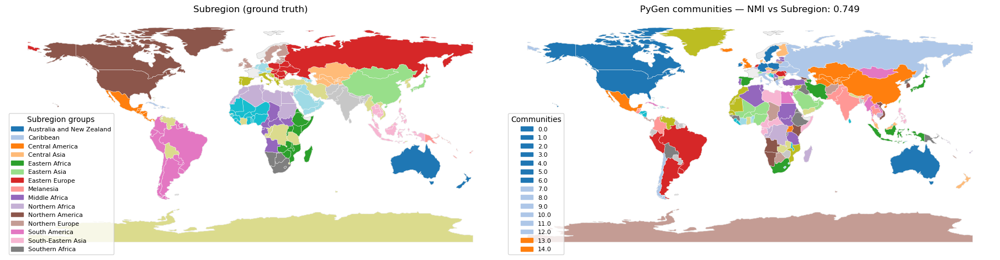

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



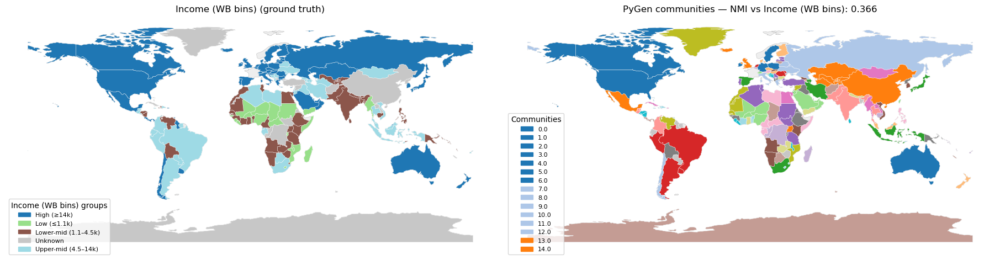

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



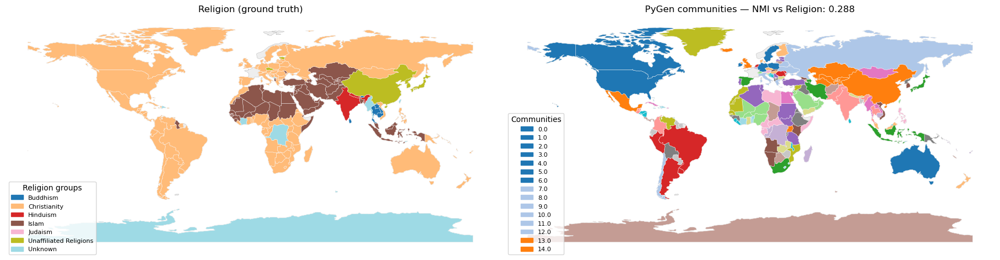


NMI summary for this scale:
  Subregion: 0.749
  Income   : 0.366
  Religion : 0.288


In [32]:
# =========================
# GeoPandas NMI Map Compare
# =========================
import os, json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import pycountry
from countryinfo import CountryInfo
from sklearn.metrics import normalized_mutual_info_score as NMI

# ---------- 0) World basemap (GeoPandas 1.x friendly) ----------
def prep_world_gdf():
    # Natural Earth (Admin 0 – Countries, 110m), fetched from NACIS CDN
    url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
    gdf = gpd.read_file(url)
    for c in ["ISO_A3", "ADM0_A3", "iso_a3", "adm0_a3"]:
        if c in gdf.columns:
            iso_col = c
            break
    else:
        raise KeyError(f"Could not find ISO3 col in: {list(gdf.columns)}")
    gdf["ISO3"] = gdf[iso_col].replace({"-99": None})
    return gdf[["ISO3", "geometry"]].copy()

WORLD_GDF = prep_world_gdf()

# Optional code fixes if your node codes use odd forms
CODE_FIX = {"UK": "GBR", "ROM": "ROU", "EL": "GRC"}
def _fix_iso3(code: str) -> str:
    return CODE_FIX.get(code, code)

# ---------- 1) Ground-truth mappings ----------
def build_iso3_to_subregion(iso_list):
    def _sub(iso):
        try:
            c = pycountry.countries.get(alpha_3=iso)
            if c is None: return "Unknown"
            return CountryInfo(c.name).subregion() or "Unknown"
        except Exception:
            return "Unknown"
    return {iso: _sub(iso) for iso in iso_list}

def build_iso3_to_income_bins(imf_xls_path, iso_list):
    import re

    # 1) Load and pick columns (keep your slice if it works for your file)
    df_imf = pd.read_excel(imf_xls_path)
    try:
        df_imf = df_imf.iloc[1:-2, [0, 24]]  # Country + 2022 col (adjust if different)
    except Exception:
        pass
    df_imf.columns = ["Country", "GDP_per_capita_2022_raw"]

    # 2) Coerce GDP text -> float (strip commas, spaces, symbols)
    def _to_float_series(s):
        s = s.astype(str).str.replace(r"[^\d\.\-eE]", "", regex=True)  # keep digits/dot/sign/exponent
        return pd.to_numeric(s, errors="coerce")

    df_imf["GDP_per_capita_2022"] = _to_float_series(df_imf["GDP_per_capita_2022_raw"])

    # 3) Country -> ISO3
    def to_iso3(name):
        try:
            return pycountry.countries.lookup(str(name)).alpha_3
        except Exception:
            return None

    df_imf["ISO3"] = df_imf["Country"].apply(to_iso3)

    # 4) Keep only rows with a valid ISO3 and numeric GDP
    df_imf = df_imf.dropna(subset=["ISO3", "GDP_per_capita_2022"]).copy()
    df_imf["GDP_per_capita_2022"] = df_imf["GDP_per_capita_2022"].astype(float)

    # 5) Build lookup (floats only)
    gdp = dict(zip(df_imf["ISO3"], df_imf["GDP_per_capita_2022"]))

    # 6) World Bank-style bins (adjust thresholds/labels if you like)
    edges = [0, 1145, 4515, 14005, np.inf]
    labels = ["Low (≤1.1k)", "Lower-mid (1.1–4.5k)", "Upper-mid (4.5–14k)", "High (≥14k)"]

    def bin_one(iso):
        v = gdp.get(iso)
        # Robust guard: ensure v is a finite float
        try:
            v = float(v)
        except (TypeError, ValueError):
            return "Unknown"
        if not np.isfinite(v):
            return "Unknown"

        b = pd.cut([v], bins=edges, labels=labels, include_lowest=True)[0]
        return str(b) if pd.notnull(b) else "Unknown"

    # 7) Build map for all iso_list
    income_map = {iso: bin_one(iso) for iso in iso_list}

    # (Optional) quick diagnostics
    # unknown_count = sum(1 for v in income_map.values() if v == "Unknown")
    # print(f"[Income bins] Unknown for {unknown_count}/{len(iso_list)} countries")

    return income_map


def build_iso3_to_religion(json_folder, iso_list):
    d = {}
    for fn in os.listdir(json_folder):
        if not fn.endswith(".json"): continue
        with open(os.path.join(json_folder, fn), "r", encoding="utf-8") as f:
            data = json.load(f)
            iso = str(data.get("ISO", {}).get("alpha3", "")).upper()
            rel = data.get("religion")
            if iso and isinstance(rel, str) and rel.strip():
                d[iso] = rel.strip()
    return {iso: d.get(iso, "Unknown") for iso in iso_list}

# ---------- 2) Plotting helpers ----------
def _factor_colors(values, cmap_name="tab20"):
    s = pd.Series(values)
    mask = s.notna()
    codes, uniques = pd.factorize(s[mask], sort=True)
    code_arr = pd.Series(np.nan, index=s.index, dtype="float")
    code_arr[mask] = codes
    cmap = plt.cm.get_cmap(cmap_name, max(2, len(uniques)))
    listed = ListedColormap([cmap(i) for i in range(len(uniques))])
    return code_arr.values, list(uniques), listed

def _build_gdf_for_maps(node_order, y_true, y_pred):
    df_map = pd.DataFrame({"ISO3": [_fix_iso3(c) for c in node_order],
                           "true": y_true, "pred": y_pred})
    return WORLD_GDF.merge(df_map, on="ISO3", how="left")

def plot_geopandas_pair(node_order, labels_pred, attr_map, attr_name):
    # Align vectors (include Unknown to keep geometry complete)
    y_true = [attr_map.get(c, "Unknown") for c in node_order]
    y_pred = list(labels_pred)

    # NMI (drop Unknowns in y_true for the score)
    mask = [yt != "Unknown" and yt is not None for yt in y_true]
    y_true_nmi = [yt for yt, m in zip(y_true, mask) if m]
    y_pred_nmi = [yp for yp, m in zip(y_pred, mask) if m]
    nmi = NMI(y_true_nmi, y_pred_nmi) if len(y_true_nmi) and len(set(y_true_nmi)) > 1 else np.nan

    gdf = _build_gdf_for_maps(node_order, y_true, y_pred)
    true_codes, true_uniques, true_cmap = _factor_colors(gdf["true"])
    pred_codes, pred_uniques, pred_cmap = _factor_colors(gdf["pred"])

    fig, axes = plt.subplots(1, 2, figsize=(18, 7), constrained_layout=True)
    # Left: ground truth
    WORLD_GDF.plot(ax=axes[0], color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)
    gdf_true = gdf[~pd.isna(true_codes)].copy()
    if len(gdf_true):
        gdf_true.plot(ax=axes[0], column=pd.Series(true_codes, index=gdf.index).dropna(),
                      cmap=true_cmap, linewidth=0.3, edgecolor="white")
    axes[0].set_axis_off()
    axes[0].set_title(f"{attr_name} (ground truth)")

    # Right: PyGen predictions
    WORLD_GDF.plot(ax=axes[1], color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)
    gdf_pred = gdf[~pd.isna(pred_codes)].copy()
    if len(gdf_pred):
        gdf_pred.plot(ax=axes[1], column=pd.Series(pred_codes, index=gdf.index).dropna(),
                      cmap=pred_cmap, linewidth=0.3, edgecolor="white")
    axes[1].set_axis_off()
    axes[1].set_title(f"PyGen communities — NMI vs {attr_name}: {nmi:.3f}" if np.isfinite(nmi) else f"PyGen communities — NMI vs {attr_name}: n/a")

    # Legends (truncate if too many)
    def legend_for(ax, uniques, cmap, title):
        max_items = 15
        items = uniques[:max_items]
        handles = [mpatches.Patch(color=cmap(i), label=str(v)) for i, v in enumerate(items)]
        ax.legend(handles=handles, loc="lower left", bbox_to_anchor=(0, -0.02),
                  frameon=True, fontsize=8, title=title)

    legend_for(axes[0], true_uniques, true_cmap, f"{attr_name} groups")
    legend_for(axes[1], pred_uniques, pred_cmap, "Communities")
    plt.show()

    return float(nmi) if np.isfinite(nmi) else np.nan

def compare_on_maps_geopandas(node_order, results, part_idx, religion_json_folder, imf_xls_path):
    node_order_fixed = [_fix_iso3(c) for c in node_order]
    sub_map = build_iso3_to_subregion(node_order_fixed)
    inc_map = build_iso3_to_income_bins(imf_xls_path, node_order_fixed)
    rel_map = build_iso3_to_religion(religion_json_folder, node_order_fixed)
    labels_pred = results["community_id"][part_idx]

    scores = {}
    scores["Subregion"] = plot_geopandas_pair(node_order_fixed, labels_pred, sub_map, "Subregion")
    scores["Income"]    = plot_geopandas_pair(node_order_fixed, labels_pred, inc_map, "Income (WB bins)")
    scores["Religion"]  = plot_geopandas_pair(node_order_fixed, labels_pred, rel_map, "Religion")

    print("\nNMI summary for this scale:")
    for k, v in scores.items():
        print(f"  {k:9s}: {v:.3f}")
    return scores

# ---------- 3) DISPLAY: set your paths & scale, then run ----------
religion_json_folder = "/Users/g_private/Library/CloudStorage/OneDrive-Personal/Universität Zürich/FS25/Complex Newtworks Yas/data/countries"
imf_xls_path = "/Users/g_private/Library/CloudStorage/OneDrive-Personal/Universität Zürich/FS25/Complex Newtworks Yas/data/IMF.xls"

# You must already have: node_order (ISO3 list), results (PyGenStability output), selected_scales (list of indices)
# Example: display the FIRST robust scale
part_idx = selected_scales[0]
_ = compare_on_maps_geopandas(node_order, results, part_idx, religion_json_folder, imf_xls_path)

# Optional: loop over all robust scales
# for i, part_idx in enumerate(selected_scales, 1):
#     print(f"\n=== Scale {i}/{len(selected_scales)} (partition index {part_idx}) ===")
#     _ = compare_on_maps_geopandas(node_order, results, part_idx, religion_json_folder, imf_xls_path)



=== Scale 1/8 (partition idx=4) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



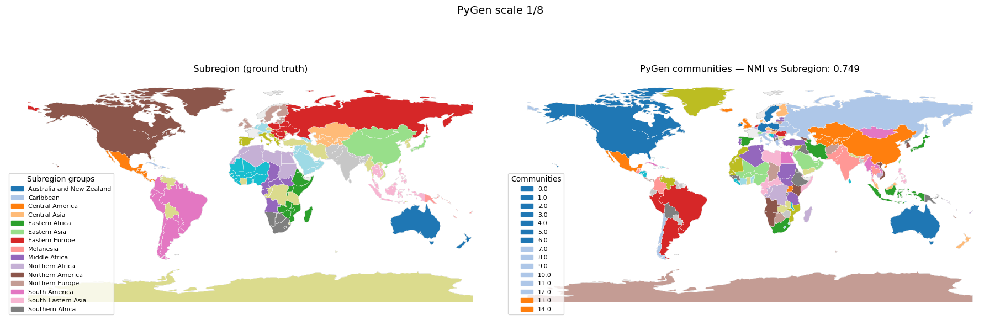

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



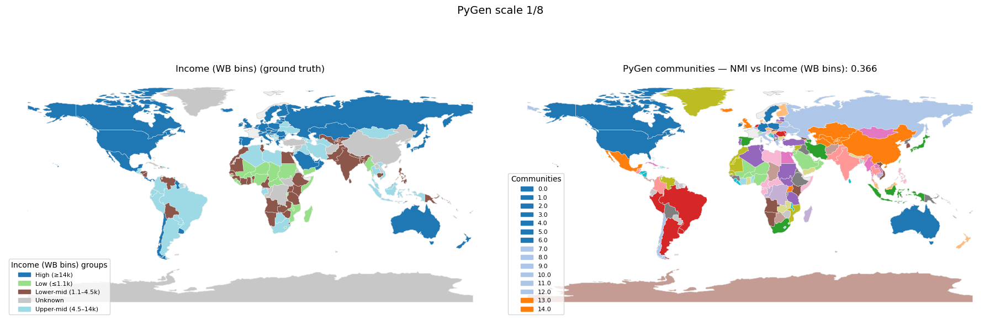

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



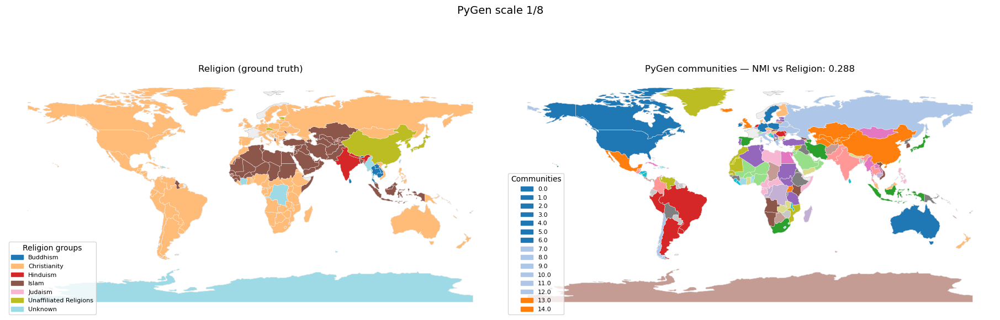

NMI summary: {'Subregion': 0.749, 'Income': 0.366, 'Religion': 0.288}

=== Scale 2/8 (partition idx=13) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



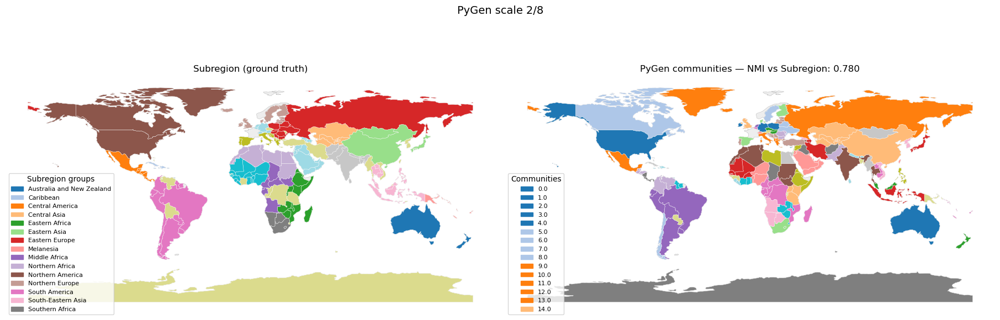

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



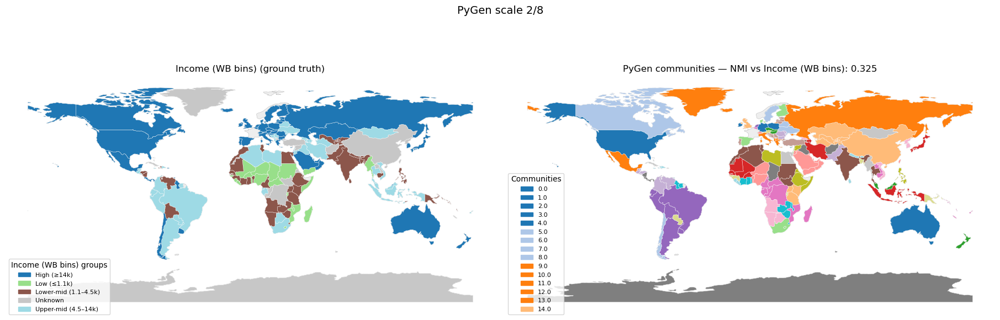

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



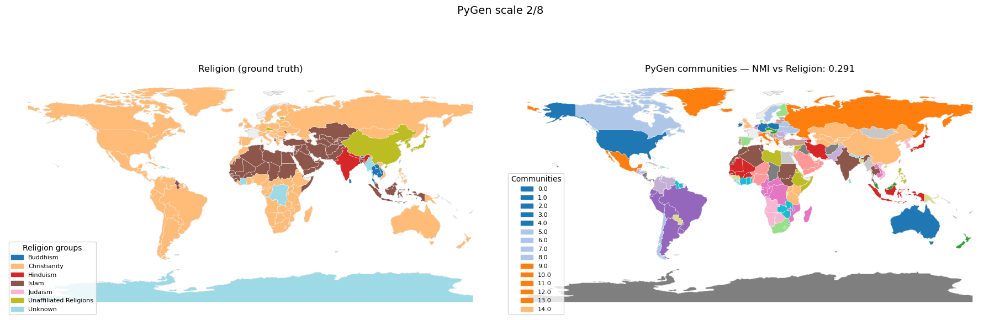

NMI summary: {'Subregion': 0.78, 'Income': 0.325, 'Religion': 0.291}

=== Scale 3/8 (partition idx=18) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



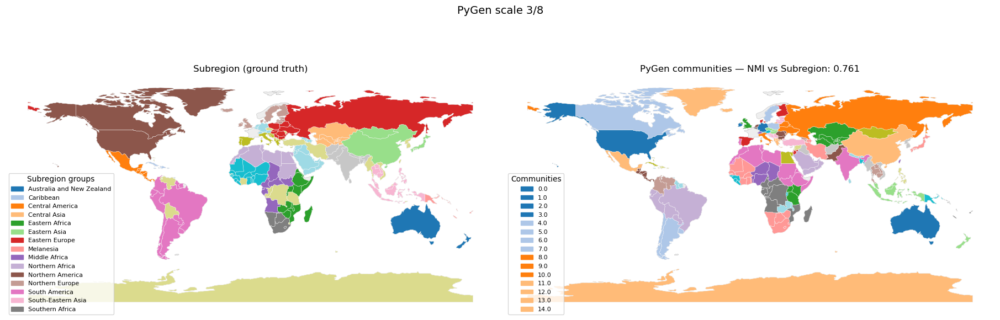

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



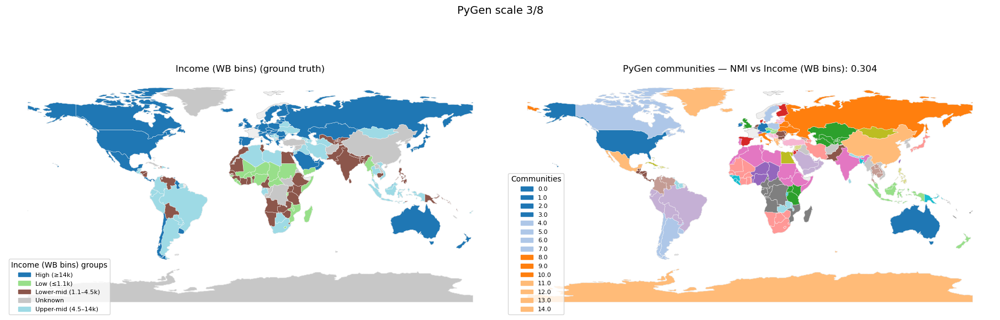

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



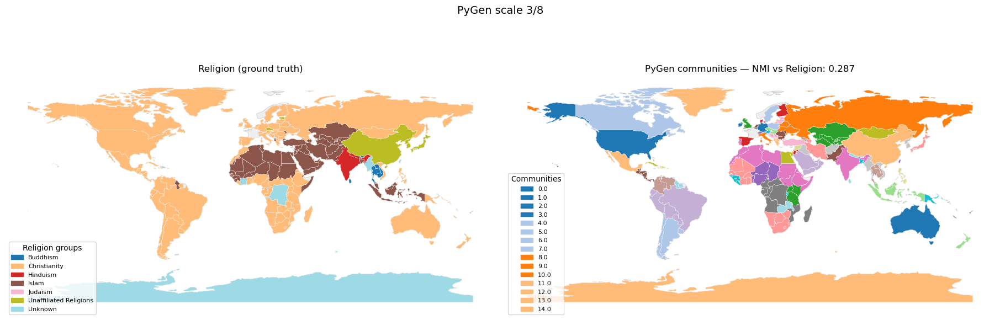

NMI summary: {'Subregion': 0.761, 'Income': 0.304, 'Religion': 0.287}

=== Scale 4/8 (partition idx=24) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



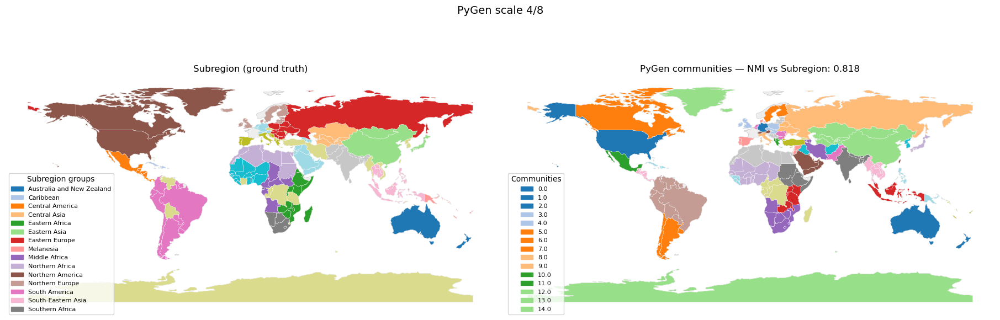

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



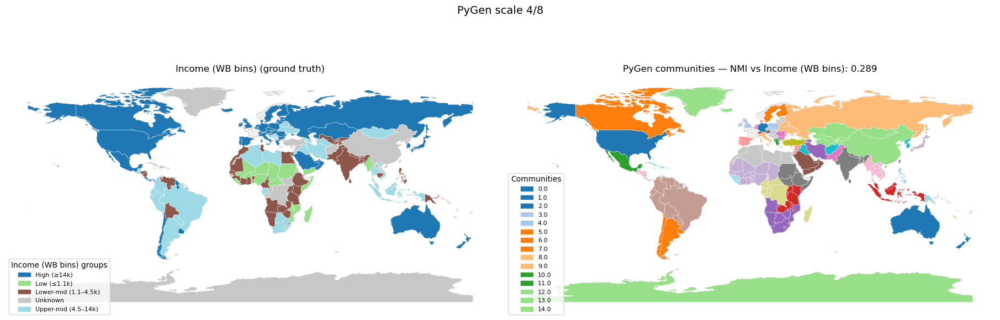

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



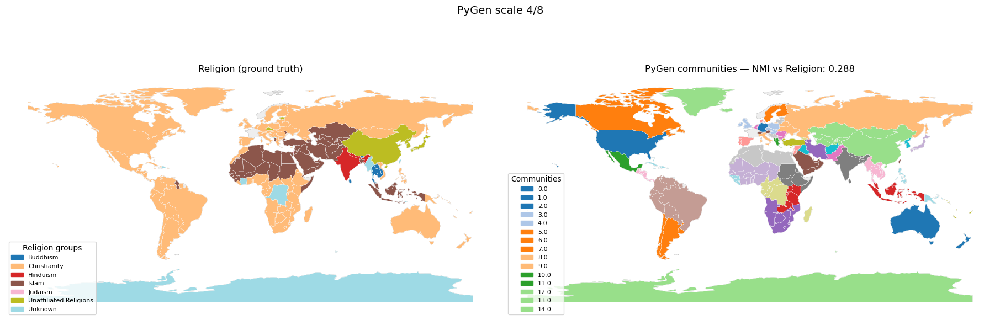

NMI summary: {'Subregion': 0.818, 'Income': 0.289, 'Religion': 0.288}

=== Scale 5/8 (partition idx=26) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



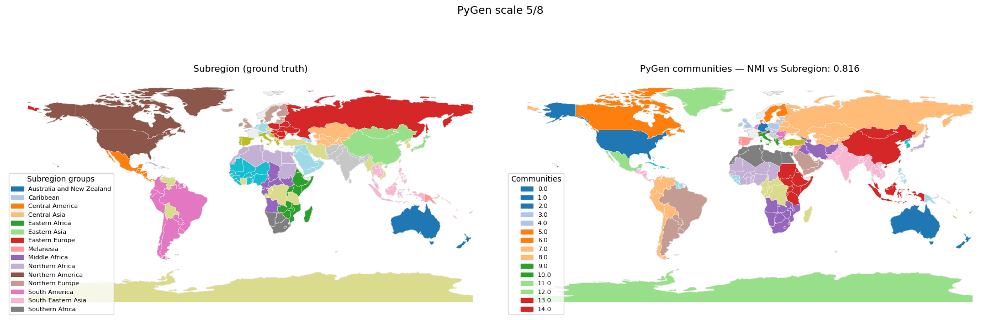

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



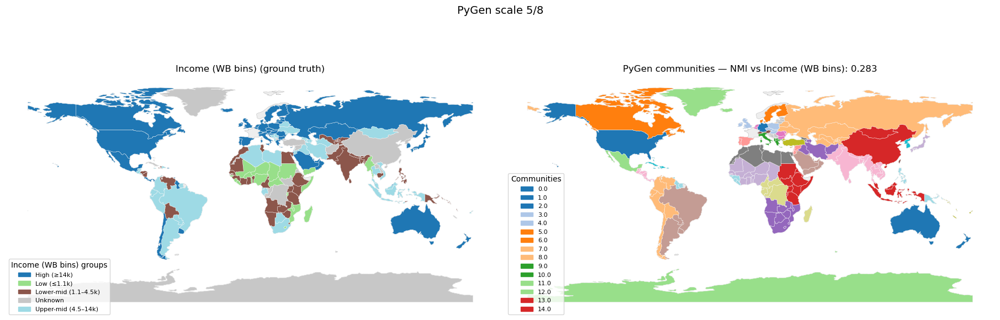

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



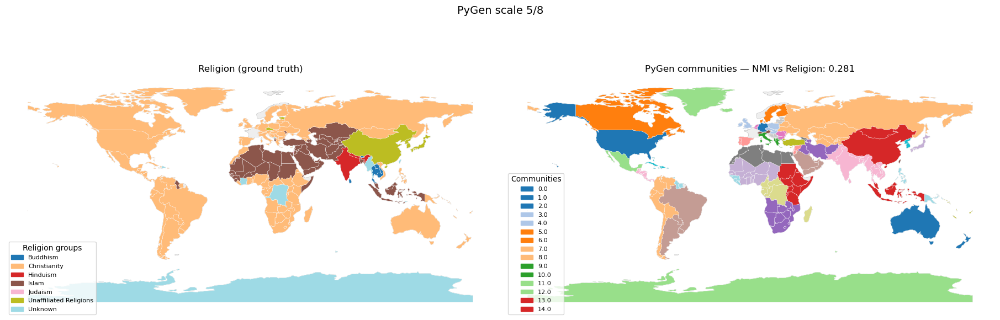

NMI summary: {'Subregion': 0.816, 'Income': 0.283, 'Religion': 0.281}

=== Scale 6/8 (partition idx=39) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



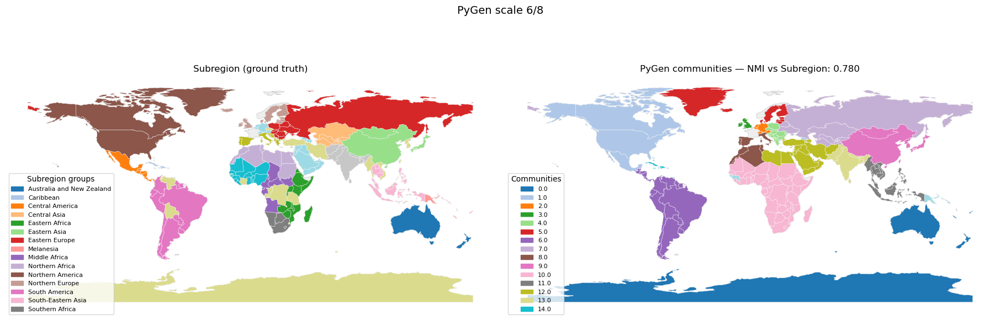

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



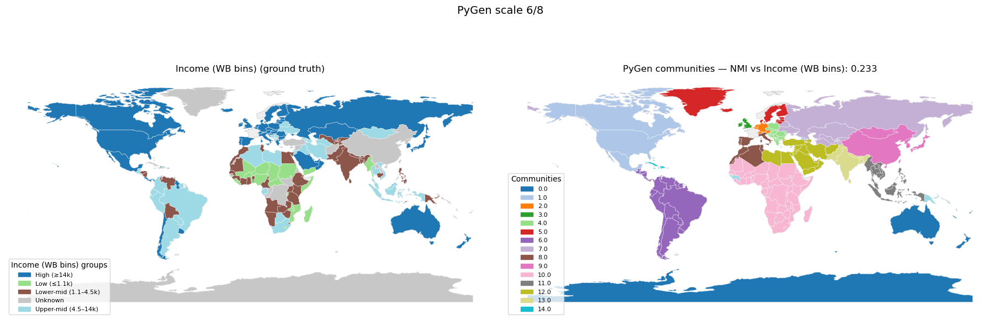

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



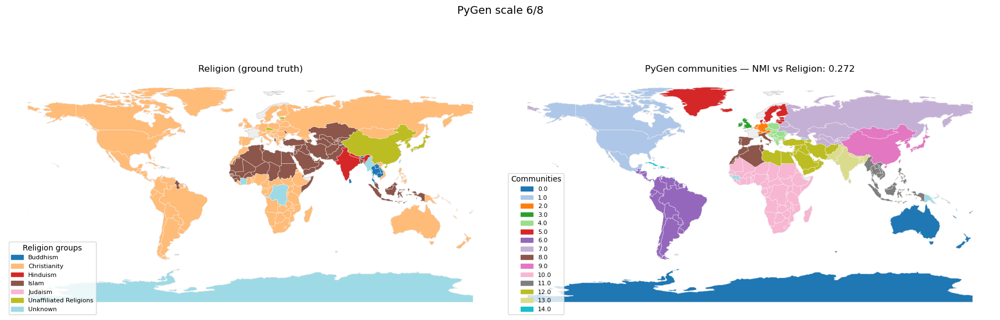

NMI summary: {'Subregion': 0.78, 'Income': 0.233, 'Religion': 0.272}

=== Scale 7/8 (partition idx=43) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



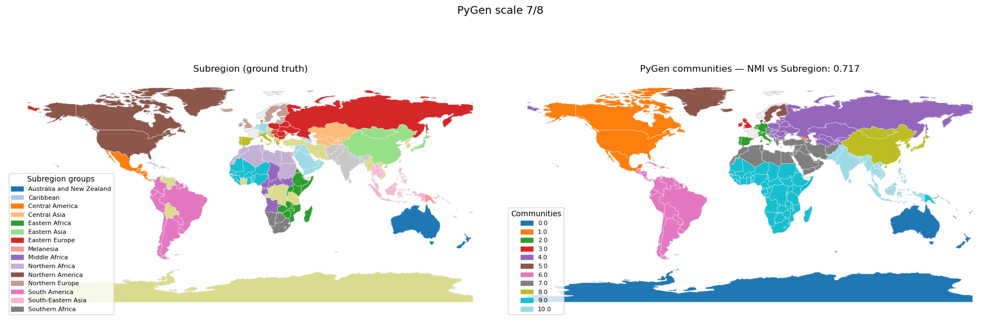

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



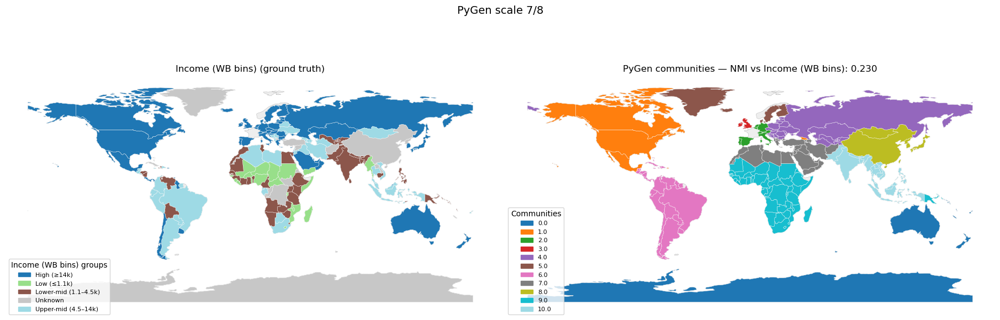

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



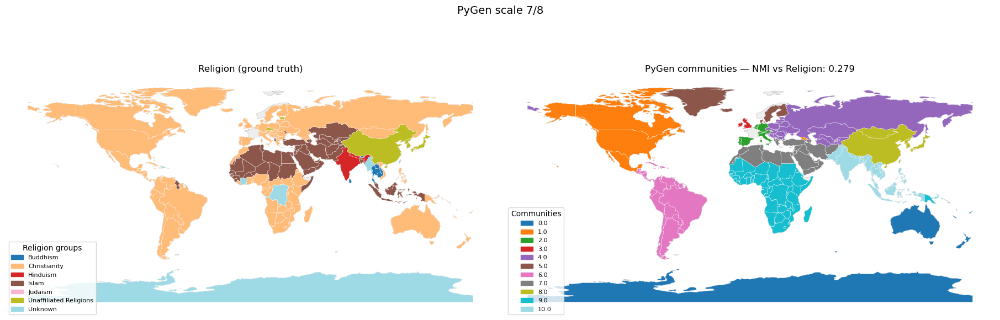

NMI summary: {'Subregion': 0.717, 'Income': 0.23, 'Religion': 0.279}

=== Scale 8/8 (partition idx=45) ===


/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



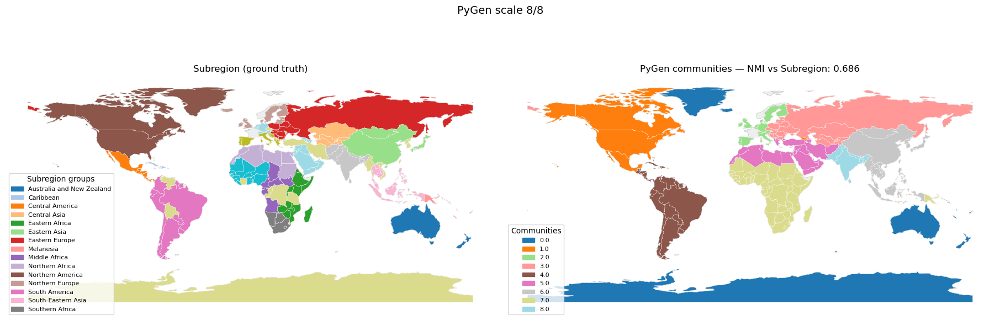

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



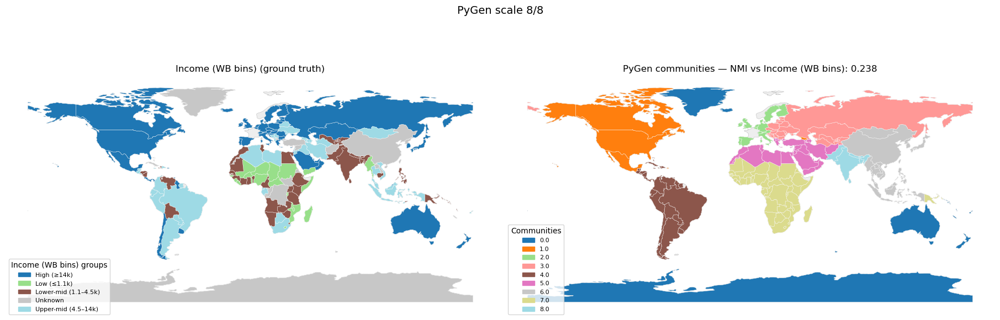

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/var/folders/fp/k9ggh24n5jv5pqnjc2558lf80000gn/T/ipykernel_72538/927865702.py:127: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



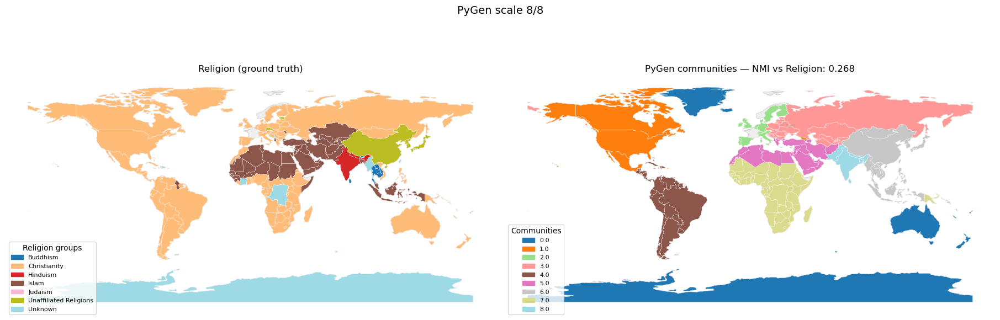

NMI summary: {'Subregion': 0.686, 'Income': 0.238, 'Religion': 0.268}

NMI table across scales:
   scale  Subregion    Income  Religion
0      1   0.748604  0.366175  0.288475
1      2   0.780033  0.324873  0.290907
2      3   0.761415  0.304122  0.287026
3      4   0.817817  0.289459  0.288439
4      5   0.816483  0.282617  0.280734
5      6   0.779808  0.232732  0.272357
6      7   0.717075  0.229720  0.278772
7      8   0.686399  0.238413  0.268311


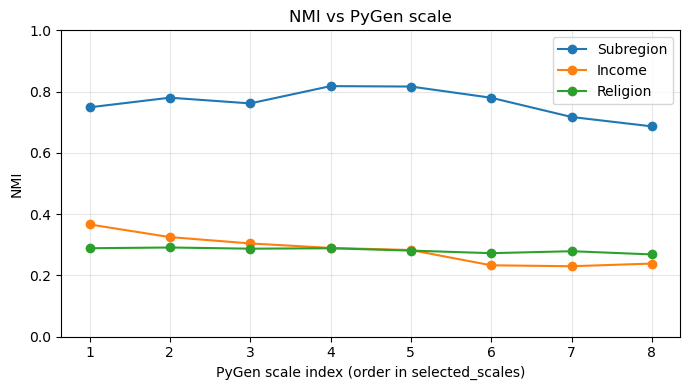

In [33]:
# --- drop-in replacement: make income bins bulletproof ---
def build_iso3_to_income_bins(imf_xls_path, iso_list):
    import re

    df_imf = pd.read_excel(imf_xls_path)
    try:
        df_imf = df_imf.iloc[1:-2, [0, 24]]  # Country + 2022 (adjust if needed)
    except Exception:
        pass
    df_imf.columns = ["Country", "GDP_per_capita_2022_raw"]

    # Coerce to numeric safely
    def _to_float_series(s):
        s = s.astype(str).str.replace(r"[^\d\.\-eE]", "", regex=True)  # keep digits/dot/sign/exp
        return pd.to_numeric(s, errors="coerce")

    df_imf["GDP_per_capita_2022"] = _to_float_series(df_imf["GDP_per_capita_2022_raw"])

    # Country -> ISO3
    def to_iso3(name):
        try: return pycountry.countries.lookup(str(name)).alpha_3
        except Exception: return None

    df_imf["ISO3"] = df_imf["Country"].apply(to_iso3)
    df_imf = df_imf.dropna(subset=["ISO3", "GDP_per_capita_2022"]).copy()
    df_imf["GDP_per_capita_2022"] = df_imf["GDP_per_capita_2022"].astype(float)

    gdp = dict(zip(df_imf["ISO3"], df_imf["GDP_per_capita_2022"]))

    # World Bank-style bins
    edges = [0, 1145, 4515, 14005, np.inf]
    labels = ["Low (≤1.1k)", "Lower-mid (1.1–4.5k)", "Upper-mid (4.5–14k)", "High (≥14k)"]

    def bin_one(iso):
        v = gdp.get(iso)
        # force float or return Unknown
        try:
            v = float(v)
        except (TypeError, ValueError):
            return "Unknown"
        if not np.isfinite(v):
            return "Unknown"
        b = pd.cut([v], bins=edges, labels=labels, include_lowest=True)[0]
        return str(b) if pd.notnull(b) else "Unknown"

    return {iso: bin_one(iso) for iso in iso_list}


# --- small tweak: allow a suptitle on each map pair (scale label) ---
def plot_geopandas_pair(node_order, labels_pred, attr_map, attr_name, suptitle=None):
    # Align vectors (include Unknown to keep geometry complete)
    y_true = [attr_map.get(c, "Unknown") for c in node_order]
    y_pred = list(labels_pred)

    # NMI (drop Unknowns in y_true for the score)
    mask = [yt != "Unknown" and yt is not None for yt in y_true]
    y_true_nmi = [yt for yt, m in zip(y_true, mask) if m]
    y_pred_nmi = [yp for yp, m in zip(y_pred, mask) if m]
    nmi = NMI(y_true_nmi, y_pred_nmi) if len(y_true_nmi) and len(set(y_true_nmi)) > 1 else np.nan

    gdf = _build_gdf_for_maps(node_order, y_true, y_pred)
    true_codes, true_uniques, true_cmap = _factor_colors(gdf["true"])
    pred_codes, pred_uniques, pred_cmap = _factor_colors(gdf["pred"])

    fig, axes = plt.subplots(1, 2, figsize=(18, 7), constrained_layout=True)
    if suptitle:
        fig.suptitle(suptitle, y=0.99, fontsize=14)

    # Left: ground truth
    WORLD_GDF.plot(ax=axes[0], color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)
    gdf_true = gdf[~pd.isna(true_codes)].copy()
    if len(gdf_true):
        gdf_true.plot(ax=axes[0], column=pd.Series(true_codes, index=gdf.index).dropna(),
                      cmap=true_cmap, linewidth=0.3, edgecolor="white")
    axes[0].set_axis_off()
    axes[0].set_title(f"{attr_name} (ground truth)")

    # Right: PyGen predictions
    WORLD_GDF.plot(ax=axes[1], color="#EEEEEE", edgecolor="#AAAAAA", linewidth=0.3)
    gdf_pred = gdf[~pd.isna(pred_codes)].copy()
    if len(gdf_pred):
        gdf_pred.plot(ax=axes[1], column=pd.Series(pred_codes, index=gdf.index).dropna(),
                      cmap=pred_cmap, linewidth=0.3, edgecolor="white")
    axes[1].set_axis_off()
    axes[1].set_title(
        f"PyGen communities — NMI vs {attr_name}: {nmi:.3f}" if np.isfinite(nmi)
        else f"PyGen communities — NMI vs {attr_name}: n/a"
    )

    # Legends (truncate if too many)
    def legend_for(ax, uniques, cmap, title):
        max_items = 15
        items = uniques[:max_items]
        handles = [mpatches.Patch(color=cmap(i), label=str(v)) for i, v in enumerate(items)]
        ax.legend(handles=handles, loc="lower left", bbox_to_anchor=(0, -0.02),
                  frameon=True, fontsize=8, title=title)

    legend_for(axes[0], true_uniques, true_cmap, f"{attr_name} groups")
    legend_for(axes[1], pred_uniques, pred_cmap, "Communities")
    plt.show()

    return float(nmi) if np.isfinite(nmi) else np.nan


# --- wrapper that runs all 3 attributes for one scale and returns NMIs ---
def compare_on_maps_geopandas(node_order, results, part_idx, religion_json_folder, imf_xls_path, scale_label=None):
    node_order_fixed = [_fix_iso3(c) for c in node_order]
    sub_map = build_iso3_to_subregion(node_order_fixed)
    inc_map = build_iso3_to_income_bins(imf_xls_path, node_order_fixed)
    rel_map = build_iso3_to_religion(religion_json_folder, node_order_fixed)
    labels_pred = results["community_id"][part_idx]

    stitle = f"PyGen scale {scale_label}" if scale_label is not None else None

    scores = {}
    scores["Subregion"] = plot_geopandas_pair(node_order_fixed, labels_pred, sub_map, "Subregion", suptitle=stitle)
    scores["Income"]    = plot_geopandas_pair(node_order_fixed, labels_pred, inc_map, "Income (WB bins)", suptitle=stitle)
    scores["Religion"]  = plot_geopandas_pair(node_order_fixed, labels_pred, rel_map, "Religion", suptitle=stitle)

    print("NMI summary:", {k: round(v, 3) for k, v in scores.items()})
    return scores


# ================
# DRIVER: ALL SCALES
# ================
# This will generate 3 figures per scale (so e.g., 9 scales → 27 figures)
nmi_rows = []
for i, part_idx in enumerate(selected_scales, 1):
    print(f"\n=== Scale {i}/{len(selected_scales)} (partition idx={part_idx}) ===")
    scores = compare_on_maps_geopandas(
        node_order=node_order,
        results=results,
        part_idx=part_idx,
        religion_json_folder=religion_json_folder,
        imf_xls_path=imf_xls_path,
        scale_label=f"{i}/{len(selected_scales)}"
    )
    nmi_rows.append({"scale": i, **scores})

# tidy NMI table
nmi_df = pd.DataFrame(nmi_rows)
print("\nNMI table across scales:")
print(nmi_df)

# Optional: quick line plot of NMI vs scale
plt.figure(figsize=(7,4))
for col, label in [("Subregion","Subregion"), ("Income","Income"), ("Religion","Religion")]:
    if col in nmi_df:
        plt.plot(nmi_df["scale"], nmi_df[col], marker="o", label=label)
plt.xlabel("PyGen scale index (order in selected_scales)")
plt.ylabel("NMI")
plt.title("NMI vs PyGen scale")
plt.ylim(0, 1.0)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()
